<a href="https://colab.research.google.com/github/Padmapalita/Portfolio_Classic_Machine_Learning/blob/main/Audio_Classification_indoors_or_outdoors_Full_machine_learning_discovery_process.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Audio Classification - indoors or outdoors
## Full machine learning discovery process

This project was completed as part of my Masters Data Science and Artifical intelligence. 

The assignment task was to demonstrate a rigourous development process to a machine learning problem. The dataset contains audio recordings of 36 specific locations across 6 areas of london. The recordings had a set phrase spoken at the start of each recording, then ambient noise of the location. Recordings were to be atleast 7 seconds long. 

### The Problem: classify audio recordings as indoor or outdoors. 

**I refined this problem down to classify locations at 1 location (Queen Mary University) as indoors or outdoors, AND to minmise the difference in false postives between classes.** 

The projects goal was not to maximise accuracy but to demonstrate methodology in feature enginnering and model selection and training. We were given no resources or training in working with audio signals before hand, so the project also encouraged independent exploration of feature engineering techniques and model trainning. 


#### The following notebook is an example of the type of exploration I might do in developing a light weight ML model for production. 

However DeepLearning tools were excluded from the exploration. This assignment was to be a 'classical' feature eningeering and ML model training exercise.



# 2 Problem formulation

Describe the machine learning problem that you want to solve and explain what's interesting about it.

Problem: Build an ML pipeline which can predict if an audio recording was taken indoors or outdoors.

Whilst I have a dataset of 2500 labelled audio samples, I am aware that these are from very different locations and times. The level of noise (between samples) combined with my lack of audio signal processing have led me to refine the problem to **identifying audio samples taken at Queen mary university university as either indoors or outdoors**

This problem allows me to focus on the signals which might be found in a campus environment and might be generalisable to other campus environments in the UK and beyond. 

I will judge the best model as being the one creates the highest accuracy and does not lead to a significant difference in the false nagetive and false positive (less than 50% difference between classes false predictions)

To do this I will use a confusion matrix to calculate these values along with senstivity, specificity, Postive predictive value and negative predictive value. 

# 3 Machine Learning pipeline

In this section I will describe the ML pipeline to be used in production. 
for a description of how this pipeline was created, the experiments were run and their results, please see the sections below. 


## Data inputs
- a .wav audio file
- length must be greater than 4 seconds, ideally no more than 20 seconds


## Data preprocessing

#### Selection of best subsample from audio sample
input: Pathway to files
- Calculate three 4 second duration offsets from each audio sample. 
- Identify the percentage voiced for each subsample using librosa.pyin()
- Select the subsample with the lowest percentaged voice for full processing
output: a 4 second offset for each file to used for feature extraction

#### Process each subsample
inputs: 4 second subsample offset for each file.
- Extracts 3 features from the subsample


**mfcc_11:** The 11th Mel Frequency Cepstral Coefficent of the subsample using the librosa.feature.mfcc() function

**pow_spec_mean:** The avereage of the chromagram of the power spectrogram using librosa.feature.chroma_stft() and taking the np.mean() of the result.

**pow_spec_std:** The standard deviation of the chromagram of the power spectrogram using librosa.feature.chroma_stft() and taking the np.std() of the result. 

- Save canditate features to a numpy array

output: a 1X3 numpy array containing one observation, three features


## ML pipeline
input: a 1X3 numpy array containing one observation, three features
#### Data normalisation
- data is normalised within the pipeline using a standard scaler trained on the 2500 samples used in this model


#### C-Support Vector Classification svm.SVC(C=3.5,gamma=0.2)
- the nomalised data is passed into a pre-trained model

output: prediction, If True = indoors predicted, if False = outdoors predicted

**This ML pipeline has an estimated accuracy of 71.4%**
and is designed to keep the difference between classes incorrect predictions within 50%
(less than a 50% difference between the number of false positives and false negatives.)



# 4 Transformation stage

In this section I will out line the early stages of the ML process, from the raw inputs, and experimental process used to arrive at the final transformed data used by the ML model. 

## Data inputs
- 2500 .wav audio samples from across london
- MLendLS.csv containing label information indexed by audio sample names


## Data preprocessing
### The numbered sections relate to the experiments in the later sections


### 7.01 Select best subsample from each audio sample
input: Pathway to files
- Calculate three 4 second duration offsets from each audio sample. 
- Identify the percentage voiced for each subsample
- Select the subsample with the lowest percentaged voice for full processing
- This stage removes un-needed noise from the signal which we are interested in (the background of the recording)
output: a 4 second offset for each file to used for feature extraction

### 7.02 Process each subsample

inputs: 4 second subsample offset for each file.
- Extract 40 canditate features from the subsample
**candidate features created are:** 

power: The average power output from the subsample

pitch_mean: The average pitch of the subsample

pitch_std: The standard deviation of the pitch calculated from the subsample

mfcc_01, mfcc_02 , mfcc_03 , mfcc_04 , mfcc_05 , mfcc_06 , mfcc_07 , mfcc_08 , mfcc_09 , mfcc_10 , mfcc_11 , mfcc_12 , mfcc_13: These are the first 13 Mel Frequency Cepstral Coefficents (MFCCs) which are widely used in speech recognition applications. 

rms_01 , rms_02 ,  rms_03 , rms_04 , rms_05 , rms_06 , rms_07 , rms_08 , rms_09 , rms_10: the averaege of the first 10 values from root-mean-square (RMS) value for each frame. This is a simplified version of STFT Short-time Fourier transform. I was interested to see if this could provide a signal, so included it. 

ft_mean: Is the avereage of the STFT Short-time Fourier transform after being transformed to decibels. It is a measure of frequency over time, and a precursor to the power_spectralgram (see below)

ft_std: the standard deviation of the FT mean sample calculated from the subsample. 

contrast_mean: Contrast is a measure of the highs and lows within a sample frame. I have taken the avereage of the subsample. 

contrast_std: The standard deviation of the contrast_spectrum calculated from the subsample

p1_mean: mapping the subsample against a order of polynopmial (n=1) returns a simplified visual description of the sample. I have taken the mean of the P1 values from each sub sample. 

p1_std: the standard deviation of the P1 polynomial calculated from the subsample. 

zero_crossing_mean: the zero corssing rate is the time taken for an audi sample to cross the zero point to postive or negative values, it can be thought of as a measure of variability in the sample. I have taken the mean value calcualted from the subsample. 

zero_crossing_std: the standard deviation of the zero crossing values caculated from the sub sample. 

pow_spec_mean: the power spectrogram is calculated from the STFT is a more complex (fuller) description of frequency over time. The mean of the subsample is taken in this measure 

norm_pow_spec_mean: The normalised vector of the power spectogram (as above). The mean of the subsample is taken.

pow_spec_std: The standard deviation of the power spectrogram of the sub sample

norm_pow_spec_std: the standard deviation of the normalised power spectrogram. 

spec_roll_mean: The spectral roll off is a feature which can be used to estimate the maximum frequency of the sub sample. The mean of the subsample is given. 

spec_roll_std: the standard deviation of the spectral roll off. 

- Save canditate features to a dataframe along with labels from MLendLS.csv

output: Data fram containg the candiatate features and original labels. 

output: a CSV of the above dataframe for backup. 

### 7.03 Removal of observations with NaN values
- 390 samples failed to return pitch_mean or pitch_std after processing, any observation with NaN as a value in these two canditates are removed from the feature dataframe. 
- This step was taken as earlier experiments showed the importance of these two canditates and how removing NaNs rather than replacing them with 0.0 led to a better priction space for our model evaluation stage. 


### 7.06 create a list of labels for data visualisation
- Create a list of labels called 'labels' from the indoors column encoding 1 for True/indoors, -1 for False/outdoors. 

outputs: A list 'labels' for use in the data exploration stage containing values 1(indoors) and -1(outdoors) 


## Data exploration
### the numbered sections relate to the experiments in the later sections
inputs: Dataframe with column 'Indoors' containing True and False values

inputs: A list 'labels' for use in the data exploration stage containing values 1(indoors) and -1(outdoors) 

### 7.07 visualise the distribution of the candidate features grouped by location
- use Histograms and density plots with normalised and un normalised data. 
- identify candidates which show variation in distribution when grouped by indoors label. 

### 7.08 Normalise the dataset for the remaining visualisations
- Check that the normalisation has left the histogram and density plots unchanged 

### 7.09 Pairplot each candidate feature along with indoors labels
- Pairplot all of the candidate features against each other, looking for separation between the indoors labels.

### 7.10 Explore interesting candidate pair plots in more detail
- Review sub groups of the candidates in scatterplots or pairplots to confirm groupings which show good separation between the locations. 

### 7.11 Visualise a short-list of the candidates to decide the final set of features
- Reduce the number of features/ create a shortlist of features which are likely to create a prediction space which would maximise separation between the indoors labels. 

### 7.12 Decide on final feature set
- justify the final feature set based on data. 

### 7.13 Explore if more transformation would be of benefit

- Use a principal components analysis with 1 component to help eliminate candidate features.
- If more than 3 features have been selected, use PCA analysis to reduce the dimensionality of the data to visualise the prediction space. 

### 7.14 define the final data processing pipeline to be used for model selection
- Create a dataset ready for model selection experiments

outputs: a dataframe containing the un-normalised features and the labels for indoors


## The final set of transformations needed in production will be:
1. take a 4 second subsample of any audio sample provided. This must have a low percentage voice component using the pyin function from the librosa library. 
2. extract three features using the librosa library (and the function in 7.02)
- mfcc_11
- pow_spec_mean
- pow_spec_std
3. this data is now ready to be passed into the production pipieline, where it will be normalised and run through the model

# 5 Modelling

After looking at the prediction space it was clear that while we have good seperation in our outcome labels we do not have clear clumps of data that a logistic regression would be able to draw a straight line through. 

because of this I have chosen models which broadcast the data into higher demensions (C support vector classification), create non-linear boundaries (kNeighboursClassifer, randomForrestClassifier) or can learn curved decision boundaries (Quadratic descriminant analysis), I have also included logistic regression to see what the performance of this model will be. 

If key interest to me here, is which model creates the highest accuracy whilst still keeping the incorrect predictions within a 50% tolerance
- the prediction space (see figure below) shows that the indoors class is more tighly packed, but the blue class (outdoors) shows greater variability. 

![figure2.png](attachment:figure2.png)

## Description of models used in model selection


### 8.09 KNeighborsClassifier (with hyperparameter selection)
- Uses the distribution of the data to classify new observations based on k number of nearest neighbours. 
 

### 8.10 RandomForestClassifier (with hyperparameter selection)
- Defines the classifier by how the prediction sapce can be split to reach a state where each leaf is pure or 100% of one class
- I thought this might be ideal for the prediction space seen in data exploration. 

### 8.11 C-Support Vector Classification
- Broadcasts the data into higher deminsions and looks for a linear seperation. C is a hyper parameter which is translated as the inverse of the regularisation the model applies to the data.
- This model also has another hyperparmeter 'gamma' which is a co-efficient for the kernel used in the model
- We have stuck with te default kernel 'rbf' in this work

### 8.12 LogisticRegression 
- Standard logistic regression which uses the logit to tranform values of a linear model to probabilities


### 8.14 QuadraticDiscriminantAnalysis
- Is able to draw quadratic decision boundaries rather than linear ones. 
- I wanted to see what this model did with the prediction space we are working with. 

# 6 Methodology

As my goal is predict indoor vs outdoor audio samples and my data is set roundly balanced with 50% of my data belonging to each class, I will use accuracy, however I will reject any model which creates more than double the amount of false postive than false negatives (or visversa)


To jugde this, I have created two helper functions:
- cross_val_predict(): which implement 5 fold cross validation which will comput accuracy, but also track the actual labels vs the models predictions. 
- matrix_and_results(): Which takes the actual and predicted labels and creates a confusion matrix and calculates the sensitivity, specificity, positive predicitive value and negative predictive value, and returns the ratio of false negatives / false postives and the ratio of false postitives / flase negatives

this should help me to evaluate models effectively as the calculations will be automated.  

The full methodology from raw features to production ready model is outlined below

### the numbered heading related to the experiments and output which can be found in the later sections

### 8.01 Split the un-normalized dataset into train and test sets
- Use a 70/30 split holding back 30% of the samples for final evaluation. 
- Take 70% of the data for model evaluation. 

### 8.02 Use a standard scaler to normalise the data
- This will re-create the predictor space we have visualised, but with new mean and standard deviation based only the X_train dataset

### 8.03 create helper functions for the model testing
- cross_val_predict() uses sklearn KFold() to complete k fold cross validation, but also records the predicted labels from each fold when it is being used as validators. This allows us to get a confusion matrix off the entire X_train dataset.  
- matrix_and_results() takes the actual labels and predicted labels from cross_val_predict(), turning them into a confusion matrix, sensitivity, specificity, positive predictive value and negative predictive value. 


### 8.04 Use k-fold cross validation to evaluate different models
- I have decided on a 5 fold cross validation strategy
- I have implemented a function which manages this process, but also keeps track of the true vs predicted labels whilst running 5 fold cross validation; these will be used in the next step of the training.
- print out the average accuracy and standard deviation of the model based on 5 fold validation. 

### 8.05 Calculate the confusion matrix for each model evaluation
- Take the true vs predicted labels for each model, calculate the confusion matric, along with sensitivity, specificity, positive predictive value and negative predictive value. 

### 8.06 Explore different hyper parameters of K-nearest_neighbour, Random Forrest Classifier, & Support Vector Machine models
- using the two sections above set up iterations of models which have hyper parameters.
- for K-nearest-Neighbour use odd numbers from 1 - 17.
- for C-Support Vector Classification loop through different C values and gamma values of the default 'rbf' and 'poly' kernels
- for Random Forest classifier change the number of estimators using 1, 3, 5, 10, 15, 20, 25, 50 and the default 100

### 8.07 Review metrics of models looking for the best all-round performing models
- After running training these models and using 5 fold cross validation to calculate the confusion matrix, 
- evaluate the best model from each family, and select the best 2 performing models.  
- The goal is to achieve as high an accuracy as possible, while rejecting any model with a 50% difference in classes false predictions

### 8.16 creation of pipelines for the best two performing models
- build two pipelines which use the selected transformations and best two performaing models 

### 8.17 Evaluation of best two performing models with the test dataset
- using the original un-normalised test dataset, use the predict function to obtain accuracy
- using the test dataset predictions, create a confusion matrix and calculate metrics


### 8.18 Selection of the best performing model
- Our goal is to maximising accuracy of the model while rejecting any model which has more than a 50% difference in the false predictions between classes (ratio of flase negateive and false positives)

### 8.19 Final training of the final model with the entire dataset ready for production. 
- retain the final model with all the avaliable data, ready for production or client validation. 
- we can estimate accuracy and predictive value using our test set (8.18), but want to give the model as much information as possible for its work in production.



# 7 Dataset

In this section we will walk through the process of extracting canditate data freatures from the audio samples, label creation of the location(indoors/outdoors) of each recording. 

We then explore the dataset using visualisations and reduce our canditat list down to a final feature set. 

My approach, not being deeply familiar with audio signal processing, I will rely of the experience of others in the field and heavy leverage features which can be extracted using the librosa library. (https://librosa.org/doc/latest/index.html)

I will then let the data decide which candidate features are the most suitable to move into our final set. 

Each step in this process of extraction and exploration has been given a sub section number, which should allow the reader to understand the steps and decisions taken to arrive at your final dataset. 

### 7.01 Select best subsample from each audio sample
- Calculate three 4 second duration offsets from each audio sample. 
- Identify the percentage voiced for each subsample
- Select the subsample with the lowest percentage voice for full processing
- This strategy should give us only background noise to process and not speech from the recorder. 


In [ ]:
## import libraries needed for dataset creation and canditate feature exploration
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import os, sys, re, pickle, glob
import IPython.display as ipd
from tqdm import tqdm
import librosa

In [ ]:

# import the files
sample_path = '/Users/todddonnelly/uni_Machine_learning/miniproject/samples/*.wav'
files = glob.glob(sample_path)

# load the labels into a dataframe
Labels_DF = pd.read_csv('MLEndLS.csv').set_index('file_id') 

In [ ]:
# this function creates 4 offsets with a duration of 1.5 seconds for each audio file
def get_offsets_durations(file):
    length = librosa.get_duration(filename=file)
    start = 0.2
    middle_4s = length/2 - 2.0
    end_4s = length-4.0
    offsets = [ start,middle_4s, end_4s ]
    durations = [4.0, 4.0, 4.0]
    return offsets, durations

In [ ]:
# this function selects one of the four subsamples from get_offsets_durations()
def select_subsample(file, offsets, durations):
    voiced_percent = []
    for i in range(0, len(offsets)):
        fs = 22050
        y, sr = librosa.load(file,sr=fs, offset=offsets[i], duration=durations[i])
        winLen = 0.02 
        p = winLen*fs
        frame_length = int(2**int(p-1).bit_length())
        hop_length = frame_length//2
        _, voiced_flag, _ = librosa.pyin(y=y, fmin=80, fmax=450, sr=fs,frame_length=frame_length,hop_length=hop_length)
        voiced_fr = np.mean(voiced_flag)
        voiced_percent.append(voiced_fr)
        i += 1

    sorted_sample_indexs = np.argsort(voiced_percent)
    best_index = sorted_sample_indexs[0]
    offset = offsets[best_index]
    duration = durations[best_index]
    return offset, duration

### 7.02 Process each subsample
- Extract 40 candidate features from the subsample
**candidate features created are:** 

**power:** The average power output from the subsample

**pitch_mean:** The average pitch of the subsample

**pitch_std:** The standard deviation of the pitch calculated from the subsample

**mfcc_01, mfcc_02 , mfcc_03 , mfcc_04 , mfcc_05 , mfcc_06 , mfcc_07 , mfcc_08 , mfcc_09 , mfcc_10 , mfcc_11 , mfcc_12 , mfcc_13:** These are the first 13 Mel Frequency Cepstral Coefficents (MFCCs) which are widely used in speech recognition applications. 

**rms_01 , rms_02 ,  rms_03 , rms_04 , rms_05 , rms_06 , rms_07 , rms_08 , rms_09 , rms_10:** the averaege of the first 10 values from root-mean-square (RMS) value for each frame. This is a simplified version of STFT Short-time Fourier transform. I was interested to see if this could provide a signal, so included it. 

**ft_mean:** Is the avereage of the STFT Short-time Fourier transform after being transformed to decibels. It is a measure of frequency over time, and a precursor to the power_spectralgram (see below)

**ft_std:** the standard deviation of the FT mean sample calculated from the subsample. 

**contrast_mean:** Contrast is a measure of the highs and lows within a sample frame. I have taken the avereage of the subsample. 

**contrast_std:** The standard deviation of the contrast_spectrum calculated from the subsample

**p1_mean:** mapping the subsample against a order of polynopmial (n=1) returns a simplified visual description of the sample. I have taken the mean of the P1 values from each sub sample. 

**p1_std:** the standard deviation of the P1 polynomial calculated from the subsample. 

**zero_crossing_mean:** the zero corssing rate is the time taken for an audi sample to cross the zero point to postive or negative values, it can be thought of as a measure of variability in the sample. I have taken the mean value calcualted from the subsample. 

**zero_crossing_std:** the standard deviation of the zero crossing values caculated from the sub sample. 

**pow_spec_mean:** the power spectrogram is calculated from the STFT is a more complex (fuller) description of frequency over time. The mean of the subsample is taken in this measure 

**norm_pow_spec_mean:** The normalised vector of the power spectogram (as above). The mean of the subsample is taken.

**pow_spec_std:** The standard deviation of the power spectrogram of the sub sample

**norm_pow_spec_std:** the standard deviation of the normalised power spectrogram. 

**spec_roll_mean:** The spectral roll off is a feature which can be used to estimate the maximum frequency of the sub sample. The mean of the subsample is given. 

**spec_roll_std:** the standard deviation of the spectral roll off. 


- Save candidate features to a dataframe (and a comma separated volume as backup)


In [ ]:
# this function extracts the canditate features from each select_subsample() for each audio sample
def process_subsample(filepath, offset, duration):
    fs = 22050
    y, sr = librosa.load(filepath,offset=offset, duration=duration)
    winLen = 0.02 
    p = winLen*fs
    frame_length = int(2**int(p-1).bit_length())
    hop_length = frame_length//2
    f0, voiced_flag, voiced_probs = librosa.pyin(y=y, fmin=80, fmax=450, sr=fs,
                                                 frame_length=frame_length,hop_length=hop_length)
    power = np.sum(y**2)/len(y)
    pitch_mean = np.nanmean(f0) if np.mean(np.isnan(f0))<1 else 0
    pitch_std  = np.nanstd(f0) if np.mean(np.isnan(f0))<1 else 0
    S = librosa.stft(y)
    s_dB = librosa.amplitude_to_db(np.abs(S), ref=np.max)
    s_dB_mean = np.nanmean(s_dB)
    s_dB_std = np.nanstd(s_dB)
    
    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc = 13)
    mfcc_01 = mfccs[0][0]
    mfcc_02 = mfccs[1][0]
    mfcc_03 = mfccs[2][0]
    mfcc_04 = mfccs[3][0]
    mfcc_05 = mfccs[4][0]
    mfcc_06 = mfccs[5][0]
    mfcc_07 = mfccs[6][0]
    mfcc_08 = mfccs[7][0]
    mfcc_09 = mfccs[8][0]
    mfcc_10 = mfccs[9][0]
    mfcc_11 = mfccs[10][0]
    mfcc_12 = mfccs[11][0]
    mfcc_13 = mfccs[12][0]
    
    S, phase = librosa.magphase(librosa.stft(y))
    rms = librosa.feature.rms(S=S)
    rms_01 = rms[0][0]
    rms_02 = rms[0][1]
    rms_03 = rms[0][2]
    rms_04 = rms[0][3]
    rms_05 = rms[0][4]
    rms_06 = rms[0][5]
    rms_07 = rms[0][6]
    rms_08 = rms[0][7]
    rms_09 = rms[0][8]
    rms_10 = rms[0][9]
    
    S = librosa.stft(y)
    # amplitutde to decibel
    S_dB = librosa.amplitude_to_db((np.abs(S)), ref=np.max)
    n_fft = 2048
    ft = np.abs(librosa.stft(y[:n_fft], hop_length = n_fft+1))
    ft_mean = np.mean(ft)
    ft_std = np.std(ft)
    
    contrast = librosa.feature.spectral_contrast(S=S)
    contrast_mean = np.mean(contrast)
    contrast_std = np.std(contrast)
    
    p1 = librosa.feature.poly_features(S=S, order=1)
    p1_mean = np.mean(p1).real
    p1_std = np.std(p1).real

    zero_crossing = librosa.feature.zero_crossing_rate(y)
    zero_crossing_mean = np.mean(zero_crossing)
    zero_crossing_std = np.std(zero_crossing)
    
    pow_spec = librosa.feature.chroma_stft(y=y, sr=sr)
    pow_spec_mean = np.mean(pow_spec)
    pow_spec_std = np.std(pow_spec)
    
    norm_pow_spec = librosa.util.normalize(pow_spec, axis=0)
    norm_pow_spec_mean = np.mean(norm_pow_spec)
    norm_pow_spec_std = np.std(norm_pow_spec)
    
    spec_roll = librosa.feature.spectral_rolloff(y=y, sr=sr)
    spec_roll_mean = np.mean(spec_roll) 
    spec_roll_std = np.std(spec_roll) 

    canditate_set = [
                power, pitch_mean , pitch_std,  
                mfcc_01 ,mfcc_02 ,mfcc_03 ,mfcc_04 ,mfcc_05 ,mfcc_06 ,mfcc_07 ,mfcc_08 ,mfcc_09 ,mfcc_10,mfcc_11,mfcc_12,mfcc_13,
                rms_01, rms_02, rms_03, rms_04, rms_05, rms_06, rms_07, rms_08, rms_09, rms_10,
                ft_mean,ft_std ,contrast_mean ,contrast_std ,p1_mean ,p1_std,zero_crossing_mean ,zero_crossing_std ,
                pow_spec_mean ,pow_spec_std ,norm_pow_spec_mean ,norm_pow_spec_std ,
                spec_roll_mean, spec_roll_std, s_dB_mean, s_dB_std
               ]  
    
    return canditate_set


In [ ]:
# this feature brings the last three functions together along with the files and the Labels_DF
def getXy(files,labels_file):
    '''
    select a 1.5 second clip of a sample from four possible locations.
    The clip with highest voiced fraction is selected
    pass this fraction to process_subsample() which returns a list of canditate features
    append these features to X, and get the label for y
    '''
    X,y =[],[]
    for file in tqdm(files):
        fileID = file.split('/')[-1]
        file_name = file.split('/')[-1]
        y_area = labels_file.loc[fileID]['area']
        y_spot = labels_file.loc[fileID]['spot']
        y_Part = labels_file.loc[fileID]['Participant']
        y_indoor = labels_file.loc[fileID]['in_out']=='indoor'
        offsets, durations = get_offsets_durations(file)
        offset, duration = select_subsample(file, offsets, durations)
        canditate_features = process_subsample(file, offset, duration )
        X.append(canditate_features)
        y.append([y_area,y_spot,y_Part,y_indoor])

    return np.array(X),np.array(y)

In [ ]:
# process the audio
X,y = getXy(files, labels_file=Labels_DF)

In [ ]:
# put X, y into a dataframe to make it easier to work with. 
df = pd.DataFrame({ 'power': X[:,0],
                    'pitch_mean': X[:,1],
                    'pitch_std': X[:,2], 
                    'mfcc_01': X[:,3], 
                    'mfcc_02': X[:,4], 
                    'mfcc_03': X[:,5],  
                    'mfcc_04': X[:,6] ,
                    'mfcc_05': X[:,7],  
                    'mfcc_06': X[:,8],  
                    'mfcc_07': X[:,9],  
                    'mfcc_08': X[:,10],  
                    'mfcc_09': X[:,11],  
                    'mfcc_10': X[:,12],  
                    'mfcc_11': X[:,13],  
                    'mfcc_12': X[:,14],  
                    'mfcc_13': X[:,15],  
                    'rms_01': X[:,16], 
                    'rms_02': X[:,17],  
                    'rms_03': X[:,18], 
                    'rms_04': X[:,19], 
                    'rms_05': X[:,20],  
                    'rms_06': X[:,21], 
                    'rms_07': X[:,22], 
                    'rms_08': X[:,23],  
                    'rms_09': X[:,24], 
                    'rms_10': X[:,25], 
                    'ft_mean': X[:,26],
                    'ft_std': X[:,27], 
                    'contrast_mean': X[:,28], 
                    'contrast_std': X[:,29],
                    'p1_mean': X[:,30], 
                    'p1_std': X[:,31],
                    'zero_crossing_mean': X[:,32], 
                    'zero_crossing_std': X[:,33], 
                    'pow_spec_mean': X[:,34], 
                    'pow_spec_std': X[:,35], 
                    'norm_pow_spec_mean': X[:,36], 
                    'norm_pow_spec_std': X[:,37], 
                    'spec_roll_mean': X[:,38], 
                    'spec_roll_std': X[:,39],
                    's_dB_mean': X[:,40],
                    's_dB_std': X[:,41],
                    'Area':y[:,0],
                    'Spot':y[:,1],
                    'Participant':y[:,2],
                    'Indoors':y[:,3],
                  })
df.to_csv('2500_4seconds_42features_4labels.csv',index=False)

In [ ]:
# This step allows you to skip audio processing
# load the preprocessed audio features from the CSV
full_df = pd.read_csv('./featureCSVs/2500_4seconds_42features_4labels.csv')
display(full_df)

,power,pitch_mean,pitch_std,mfcc_01,mfcc_02,mfcc_03,mfcc_04,mfcc_05,mfcc_06,mfcc_07,...,norm_pow_spec_mean,norm_pow_spec_std,spec_roll_mean,spec_roll_std,s_dB_mean,s_dB_std,Area,Spot,Participant,Indoors
0,0.003380,0.000000,0.000000,-284.583527,148.111023,-9.196944,15.336130,-25.852240,22.608870,-11.948157,...,0.446272,0.274280,3677.323428,474.357233,-52.628128,15.957550,westend,trafalgar,S130,False
1,0.001964,398.938398,17.617852,-224.939194,116.158501,1.875368,29.115004,-37.898048,33.391418,-20.437078,...,0.486211,0.277349,4668.784293,969.232698,-50.424625,15.824252,campus,library,S108,False
2,0.003264,0.000000,0.000000,-207.978256,181.186554,-16.586864,28.021080,-0.117611,9.452290,-0.979534,...,0.516873,0.250180,2603.588303,257.170853,-52.940769,16.488182,kensington,dinosaur,S179,True
3,0.000544,0.000000,0.000000,-229.280472,107.249268,-34.568489,-15.148922,-40.376976,9.395450,11.031420,...,0.476007,0.264075,3979.846262,638.255168,-48.937157,14.025012,campus,ground,S133,True
4,0.000029,0.000000,0.000000,-533.937500,172.127319,0.067974,46.655487,2.739563,14.303776,3.293543,...,0.583383,0.252923,1562.277451,408.993369,-60.535931,17.395494,westend,national,S113,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,0.003859,130.049885,12.092361,-233.771286,143.035370,10.386969,31.817516,12.132633,16.680561,-5.463397,...,0.421697,0.289278,2541.042438,577.288297,-58.546619,17.779783,westend,charing,S147,True
2496,0.000772,0.000000,0.000000,-255.678650,111.067688,-3.741311,17.195292,-9.102954,1.374056,-15.878705,...,0.548140,0.246723,4511.081585,743.495504,-41.941231,14.919848,westend,charing,S52,True
2497,0.000210,125.562461,7.840850,-366.773621,131.318085,-9.788562,33.602829,-0.129240,22.510509,0.354884,...,0.494310,0.272770,3552.231699,481.980518,-53.160599,14.681610,british,room12,S7,True
2498,0.000895,0.000000,0.000000,-246.539352,131.159729,-13.206930,22.812460,17.910805,24.238956,-7.834131,...,0.612144,0.223814,2970.150633,676.660485,-50.899467,16.483397,british,street,S189,False


### 7.03 Removal of observations with NaN values

I want to double check if any observations have returned NaN values. 
I have previeted NaN on pitch calcualtions as this would result in 2700 observations being removed. 
- in the case of pitch these have been set to 0.0, this is due to the fact that we have explicitly removed the voice section where possible. 

The cell below shows that no data points are removed as there are no NaN values. 

In [ ]:
for col in full_df.columns:
    print('\t%s: %d' % (col,full_df[col].isna().sum()))

	power: 0
	pitch_mean: 0
	pitch_std: 0
	mfcc_01: 0
	mfcc_02: 0
	mfcc_03: 0
	mfcc_04: 0
	mfcc_05: 0
	mfcc_06: 0
	mfcc_07: 0
	mfcc_08: 0
	mfcc_09: 0
	mfcc_10: 0
	mfcc_11: 0
	mfcc_12: 0
	mfcc_13: 0
	rms_01: 0
	rms_02: 0
	rms_03: 0
	rms_04: 0
	rms_05: 0
	rms_06: 0
	rms_07: 0
	rms_08: 0
	rms_09: 0
	rms_10: 0
	ft_mean: 0
	ft_std: 0
	contrast_mean: 0
	contrast_std: 0
	p1_mean: 0
	p1_std: 0
	zero_crossing_mean: 0
	zero_crossing_std: 0
	pow_spec_mean: 0
	pow_spec_std: 0
	norm_pow_spec_mean: 0
	norm_pow_spec_std: 0
	spec_roll_mean: 0
	spec_roll_std: 0
	s_dB_mean: 0
	s_dB_std: 0
	Area: 0
	Spot: 0
	Participant: 0
	Indoors: 0


### 7.04 Select the data for our problem
- use the Area label to select only QMUL locations


In [ ]:
areas = full_df.groupby('Area')
campus = areas.get_group('campus')
result = campus.copy()
display(result)


,power,pitch_mean,pitch_std,mfcc_01,mfcc_02,mfcc_03,mfcc_04,mfcc_05,mfcc_06,mfcc_07,...,norm_pow_spec_mean,norm_pow_spec_std,spec_roll_mean,spec_roll_std,s_dB_mean,s_dB_std,Area,Spot,Participant,Indoors
1,0.001964,398.938398,17.617852,-224.939194,116.158501,1.875368,29.115004,-37.898048,33.391418,-20.437078,...,0.486211,0.277349,4668.784293,969.232698,-50.424625,15.824252,campus,library,S108,False
3,0.000544,0.000000,0.000000,-229.280472,107.249268,-34.568489,-15.148922,-40.376976,9.395450,11.031420,...,0.476007,0.264075,3979.846262,638.255168,-48.937157,14.025012,campus,ground,S133,True
5,0.003836,0.000000,0.000000,-138.150345,105.871628,-16.415104,-2.992607,-9.202204,5.129775,-11.753505,...,0.461363,0.277869,3620.316451,925.416983,-49.490578,15.638444,campus,curve,S107,True
6,0.000815,0.000000,0.000000,-291.376678,172.805130,-31.598476,15.828130,2.629102,27.466911,3.754894,...,0.601982,0.230869,2013.976839,122.110776,-58.323700,18.035227,campus,square,S174,False
8,0.001628,0.000000,0.000000,-222.655762,152.735809,-12.347486,14.853333,16.066332,17.677715,-7.256118,...,0.509916,0.261506,4674.260945,1184.330525,-46.949112,13.722838,campus,curve,S69,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2483,0.001393,0.000000,0.000000,-169.874237,83.308777,-42.974022,40.482723,-33.967262,28.350033,-12.068350,...,0.724838,0.165556,5466.135155,136.803431,-41.131035,19.835634,campus,canal,S122,False
2485,0.000016,0.000000,0.000000,-431.142395,98.900528,-13.605249,-4.881994,-15.644312,-16.414545,-31.363070,...,0.504906,0.262229,5728.578848,946.128733,-57.382565,14.977798,campus,reception,S91,True
2489,0.000179,87.246481,2.241987,-407.598633,132.375763,3.294003,37.143295,15.497061,27.384777,-8.653028,...,0.598527,0.241476,3398.076369,1088.154245,-57.988632,14.955062,campus,square,S78,False
2491,0.001575,0.000000,0.000000,-318.693604,151.221161,16.590603,25.080620,5.908112,9.458535,-3.817225,...,0.507485,0.269461,2445.947830,906.049440,-65.857880,12.834379,campus,library,S80,False


### 7.05 Ensure the indoors and outdoor locations are balanced

- check the number of indoor and outdoor observations in the dataset

In [ ]:
result.Indoors.value_counts()

False    412
True     411
Name: Indoors, dtype: int64

### 7.06 create a list of labels for data visualisation
- Create a list of labels called 'labels' from the Indoors column encoding 1 for True/Indoors, -1 for False/Outdoors.


In [ ]:
# create labels for the visualisations
labels=[]
for label in result.iloc[:,-1]:
    if label==True:
        labels.append(1)
    if label==False:
        labels.append(-1)

#print(labels)

## Data exploration


### 7.07 visualise the distribution of the candidate features grouped by location
- use Histograms and density plots with normalised and un normalised data. 
- identify candidates which show variation in distribution when grouped by indoors label. 

The cells below loop through each of the candidate features and plot firstly a histogram, then secondly a density plot. The data is grouped by the label True=Indoor False=Outdoors. 

We are looking out for differences between the orange and blue data, ideally with the distrubutions of the densities. 

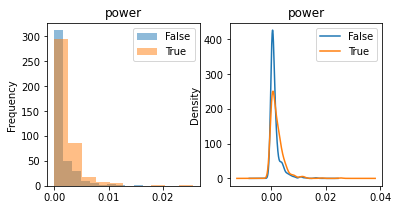

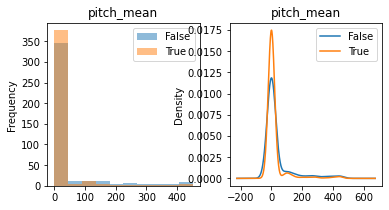

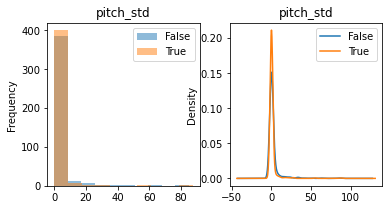

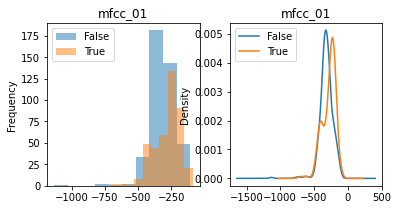

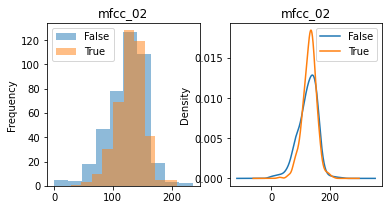

...

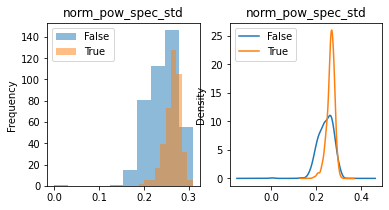

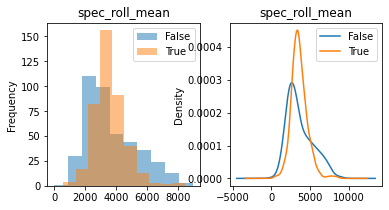

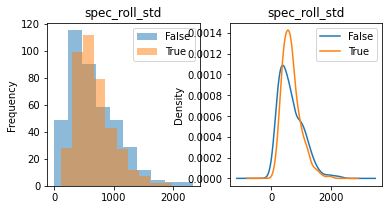

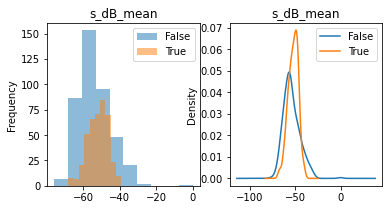

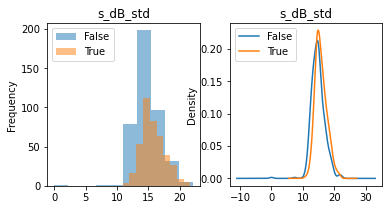

In [ ]:
%matplotlib inline
for col in result.columns[:-4]:
    fig, (a1, a2, ) = plt.subplots(1, 2, figsize = (6, 3))
    result.groupby('Indoors')[col].plot(ax=a1, kind='hist', logy=False, alpha=0.5, title=col, legend=True)
    result.groupby('Indoors')[col].plot(ax=a2, kind='density', logy=False, alpha=1.0, title=col, legend=True)
    plt.show()

By grouping each canditate feature into two subgroups and plotting the historgrams of the frequencies and the density plot we can see that the following canditats show some variations between indoor and outdoor samples

pow_spec_mean / norm_pow_spec_mean: difference in distributions with different peak values
norm_pow_spec_std / pow_spec_std: clear difference in distributions, but with a similiar peak
spec_roll_mean & spec_roll_std: show a difference in distribution and peak values
s_db_mean: shows a different distrubtion and difference in peak value


contrast_mean: slight differences, but little differences in comparision to other variables
contrast_std: differences in distribution and peak value

Zero_crossing_mean: slight variation
rms values: rms_10 is the most promising values here. 
Mfcc values, mfcc_11, mfcc_10, mfcc_06, mfcc_01 are the most promising values here. 

### 7.08 Normalise the dataset for the remaining visualisations
- apply a standard scaler to the dataset
- Check that the normalisation has left the histogram and density plots unchanged 

From our experience with the basic problem, we have identified that the data should be normalised for exploration.
The graphs below show the that underlying structure of the data has not changed, but having all canditate features centered on zero will help for visualising how each feature is distrubuted

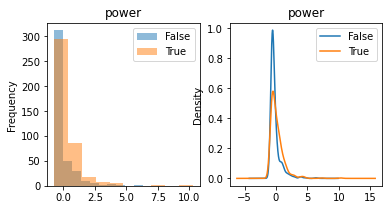

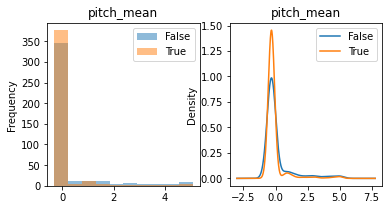

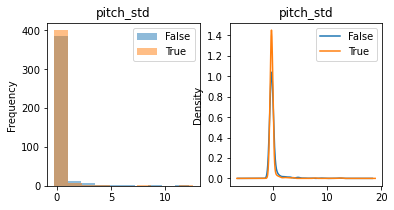

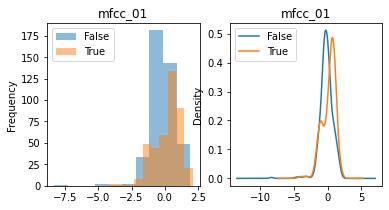

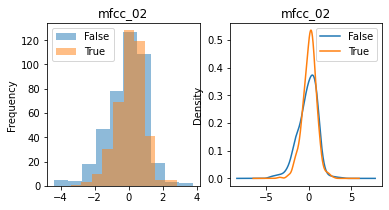

...

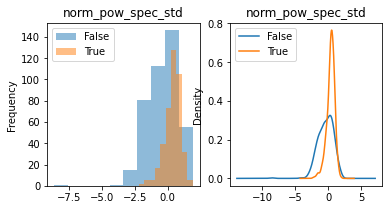

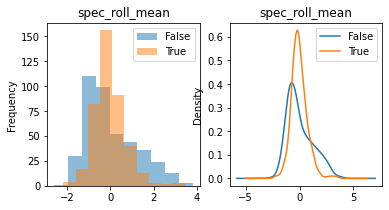

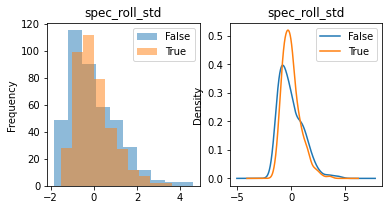

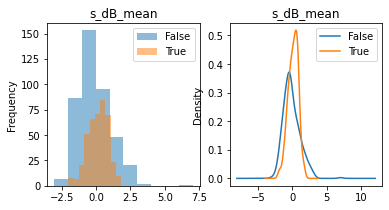

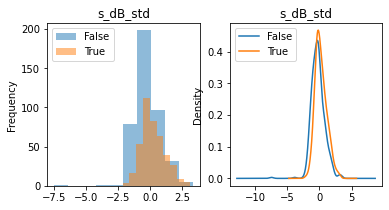

In [ ]:
from sklearn.preprocessing import StandardScaler

norm_result = result.copy()

scaler = StandardScaler()
scaler.fit(norm_result.iloc[:,0:-4])
norm_result.iloc[:,0:-4] = scaler.transform(norm_result.iloc[:,0:-4])

%matplotlib inline
for col in norm_result.columns[:-4]:
    fig, (a1, a2, ) = plt.subplots(1, 2, figsize = (6, 3))
    norm_result.groupby('Indoors')[col].plot(ax=a1, kind='hist', logy=False, alpha=0.5, title=col, legend=True)
    norm_result.groupby('Indoors')[col].plot(ax=a2, kind='density', logy=False, alpha=1.0, title=col, legend=True)
    plt.show()

### 7.09 Pairplot each candidate feature along with indoors labels

- Pairplot all of the candidate features against each other, looking for separation between the indoors labels.
- its messy but we are looking only for seperation between the blue and red dots at this stage

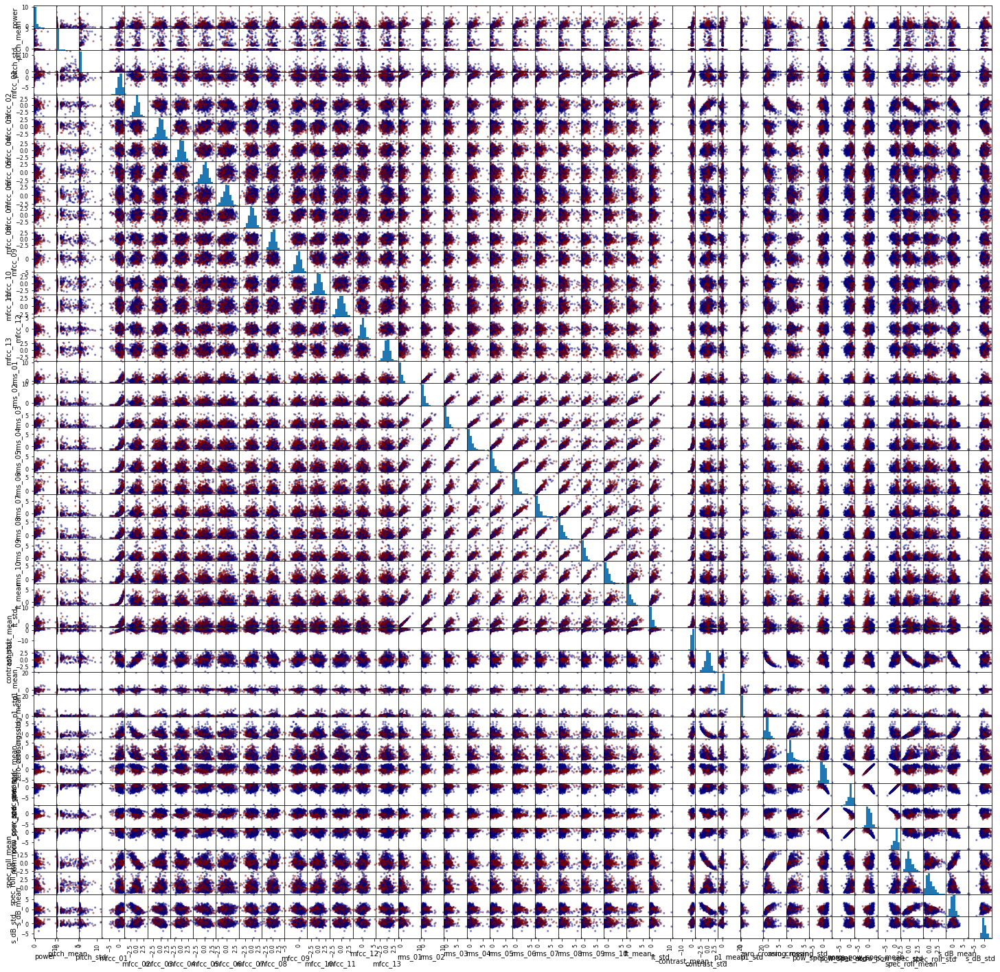

In [ ]:
%matplotlib inline
# create pairplot for the normalised canditate features, use the indoors labels to colour the datapoints
_a = pd.plotting.scatter_matrix(norm_result.iloc[:,:-4], c=labels,cmap='jet', figsize=(25,25))

Using the density plots and the pair plots it appears that the best canditates for further exploration are

[ 'mfcc_01', 'mfcc_06', 'mfcc_10' ,'mfcc_11', 'rms_10','zero_crossing_mean', 'contrast_mean','pow_spec_mean','pow_spec_std', 'norm_pow_spec_mean', 'norm_pow_spec_std','spec_roll_mean',  's_db_mean']
 
 


### pair plot a reduce set of candiate features


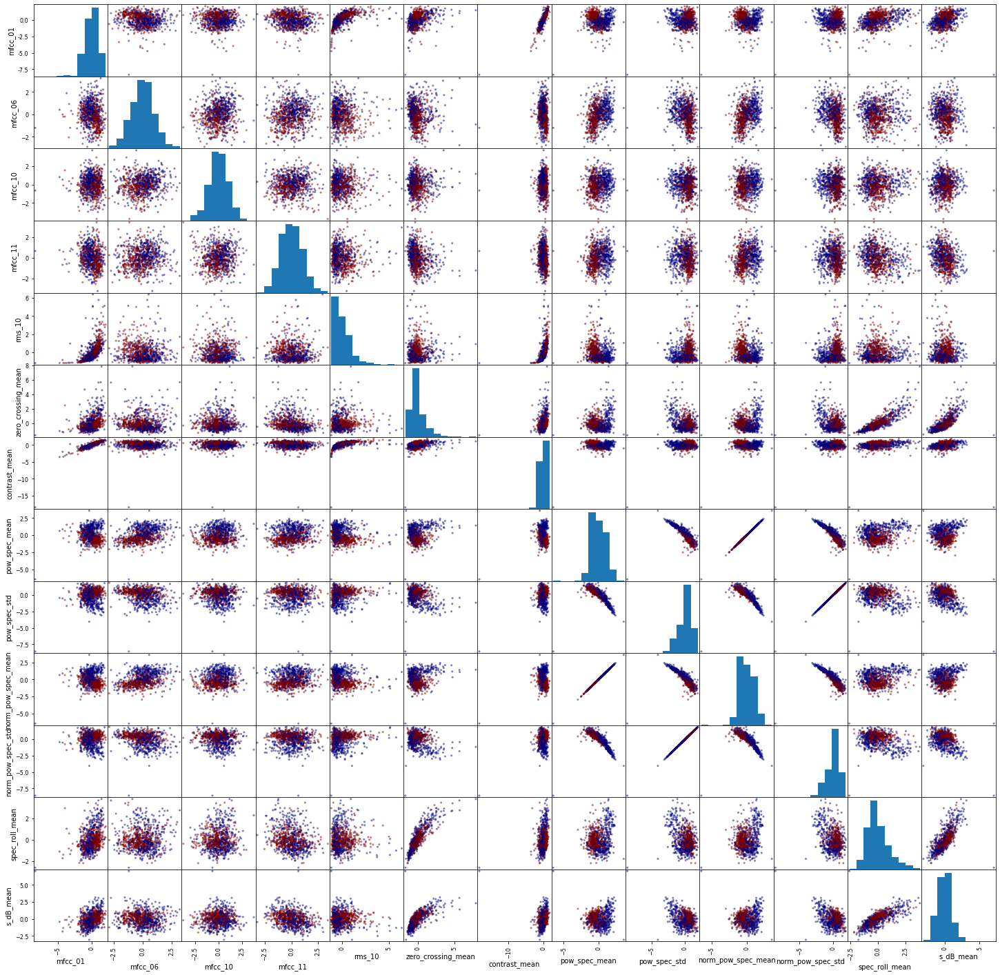

In [ ]:
keep = [ 'mfcc_01', 'mfcc_06', 'mfcc_10' ,'mfcc_11', 'rms_10','zero_crossing_mean', 'contrast_mean','pow_spec_mean','pow_spec_std', 'norm_pow_spec_mean', 'norm_pow_spec_std','spec_roll_mean',  's_dB_mean', 'Indoors']
explore = norm_result[keep].copy()
%matplotlib inline
# create pairplot for the normalised canditate features, use the indoors labels to colour the datapoints
_a = pd.plotting.scatter_matrix(explore.iloc[:,:-1], c=labels,cmap='jet', figsize=(25,25))


**Discussion**
- it  that mfcc_06 seperates the indoors and outdoors samples well with power_spec_mean
- it may be that power_spec_std also would be helpful. 
- the relationship between power_spec_mean and power_spec_std MAY be ok, but i would want to see this in more detail. 
- zero crossing_mean might be good with power_spec_mean and mfcc_06. 
- the seperation with pow_spec_std might not be as good. 


- mfcc_11 shows good seperations with pow_spec_mean and spec_roll_mean

### 7.10 Explore interesting candidate pair plots in more detail
- Review sub groups of the candidates in scatterplots or pairplots to confirm groupings which show good separation between the indoors labels
. 


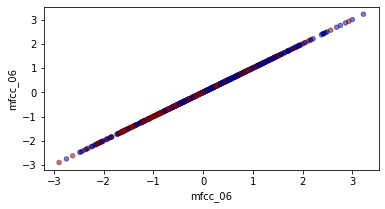

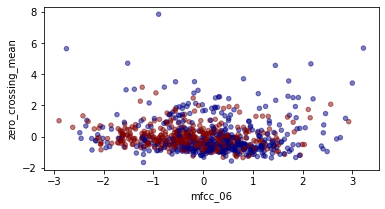

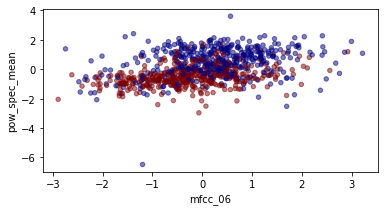

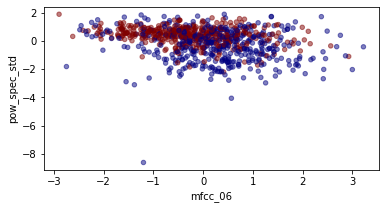

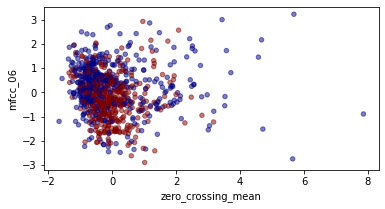

...

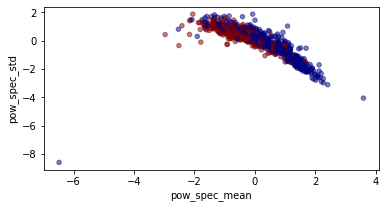

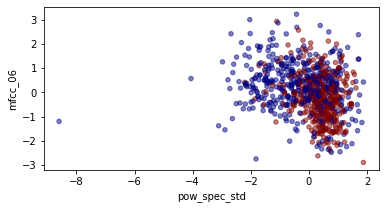

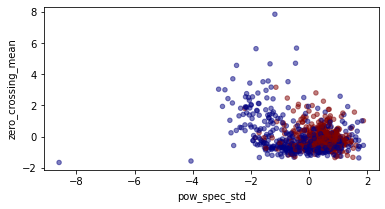

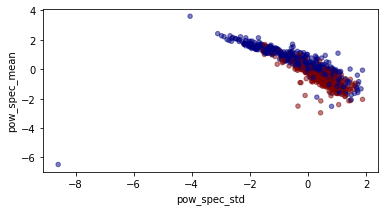

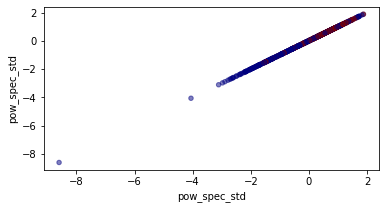

In [ ]:
explore_set_1 = [ 'mfcc_06', 'zero_crossing_mean', 'pow_spec_mean','pow_spec_std', ]

for value in explore_set_1:
    for col in explore_set_1:
        fig, (a1) = plt.subplots(1, 1, figsize = (6, 3))
        explore.plot(ax=a1, kind='scatter',  x=value, y=col,c=labels,cmap='jet', alpha=0.5,legend=True)
        plt.show()

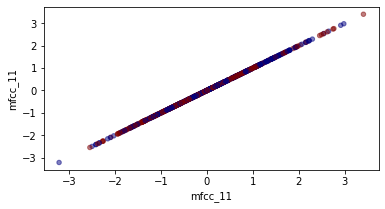

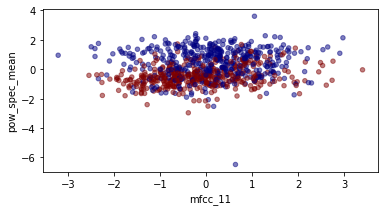

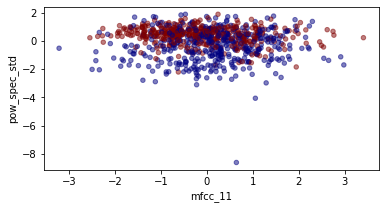

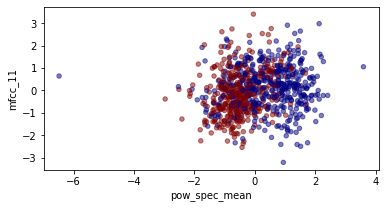

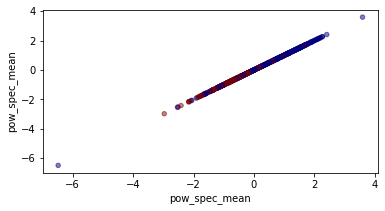

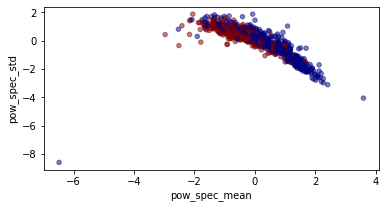

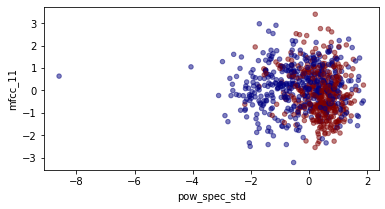

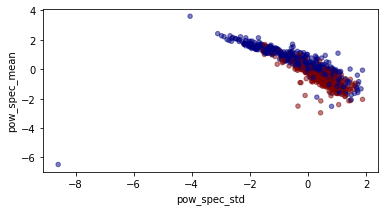

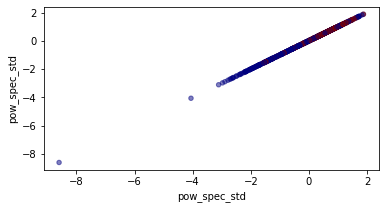

In [ ]:
explore_set_2 = [ 'mfcc_11', 'pow_spec_mean','pow_spec_std', ]

for value in explore_set_2:
    for col in explore_set_2:
        fig, (a1) = plt.subplots(1, 1, figsize = (6, 3))
        explore.plot(ax=a1, kind='scatter',  x=value, y=col,c=labels,cmap='jet', alpha=0.5,legend=True)
        plt.show()

From this exploration it appear that the explore_set_2 provides a better seperation of the indoor and outdoor lables. This tallies well with the differences in the density distrubtions in section 7.08



### 7.11 Visualise a short-list of the canditates to decide the final set of features
- Reduce the number of features/ create a shortlist of features which are likely to create a prediction space which would maximise separation between the indoors labels. 


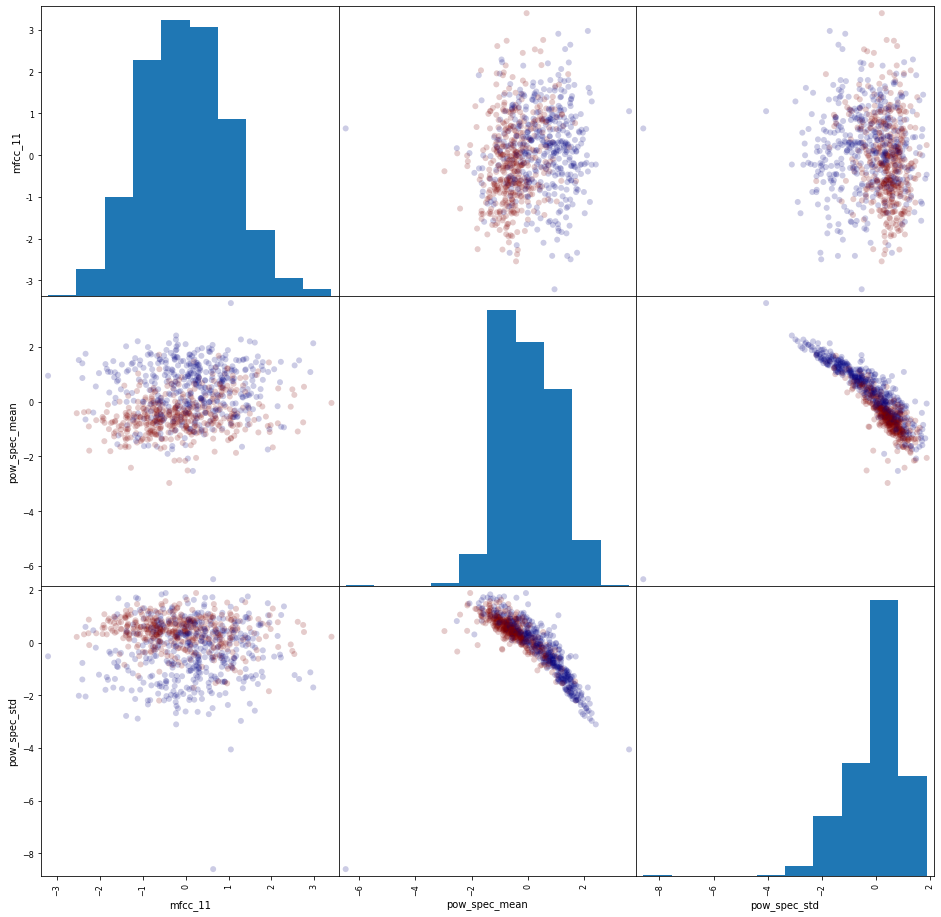

In [ ]:
short_list_cols = [ 'mfcc_11', 'pow_spec_mean','pow_spec_std','Indoors' ]

short_list = norm_result[short_list_cols].copy()
_a = pd.plotting.scatter_matrix(short_list.iloc[:,:-1], c=labels,cmap='jet',alpha=0.2,marker="O", figsize=(16,16))

lets create a 3d visualisation between these three variables to see if the labels are seperated in a way that is not obvious via the scatter plots. 

<IPython.core.display.Javascript object>


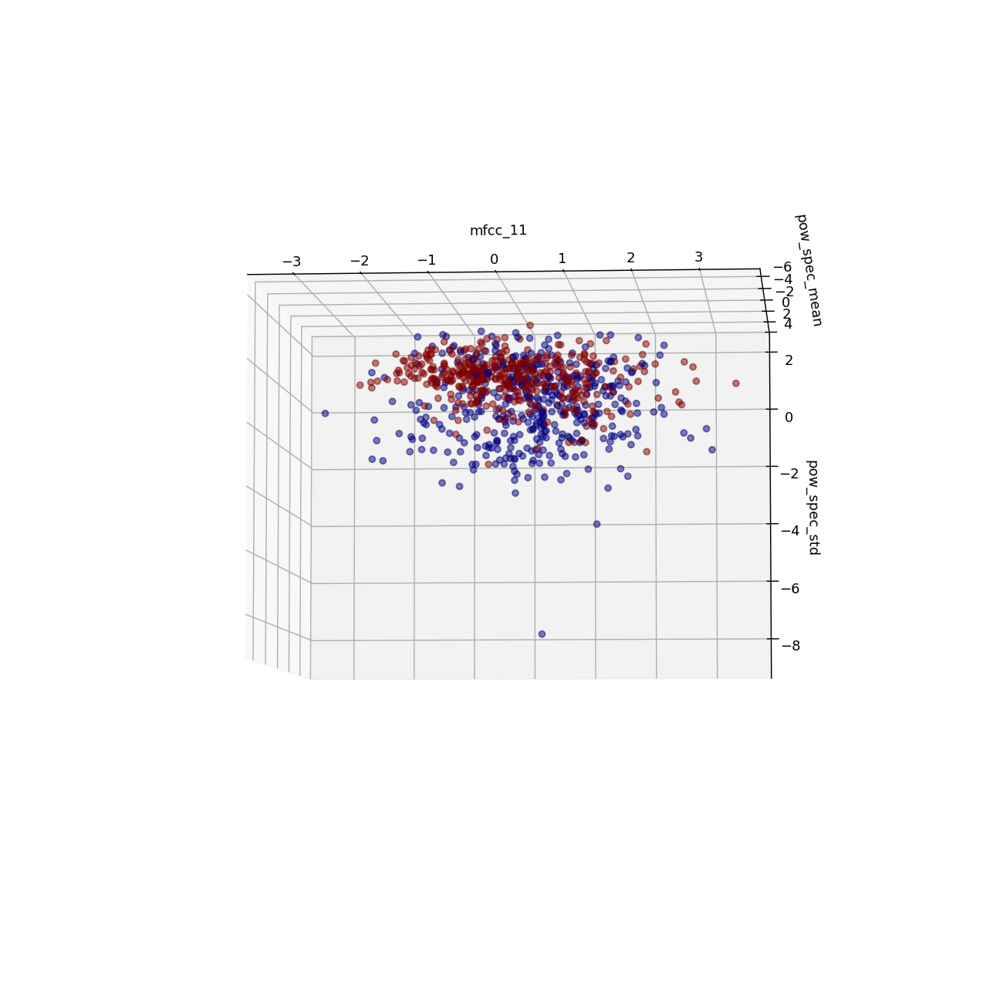

In [ ]:
%matplotlib notebook
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
p = ax.scatter(short_list.iloc[:,0],short_list.iloc[:,1],short_list.iloc[:,2],c=labels,cmap='jet', alpha=0.5)
ax.set_xlabel('mfcc_11')
ax.set_ylabel('pow_spec_mean')
ax.set_zlabel('pow_spec_std')
plt.show()

<IPython.core.display.Javascript object>


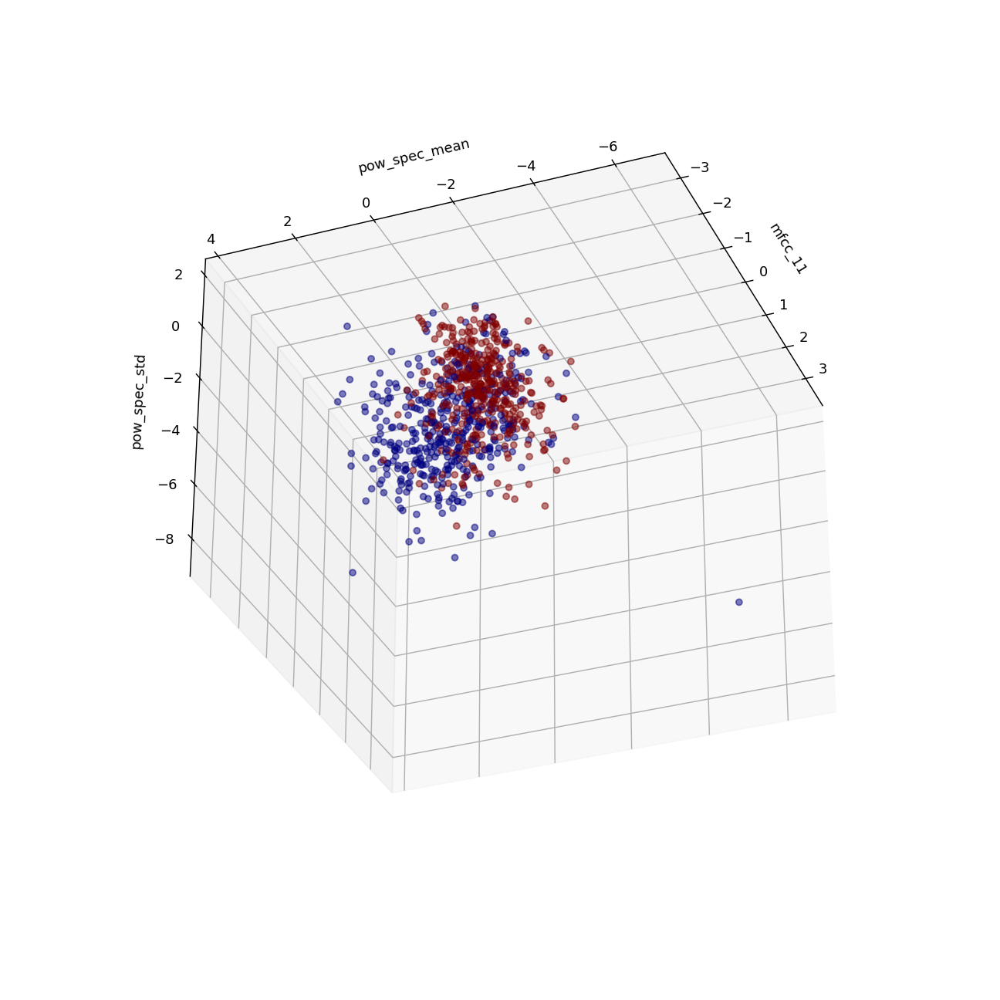

In [ ]:
%matplotlib notebook
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
p = ax.scatter(short_list.iloc[:,0],short_list.iloc[:,1],short_list.iloc[:,2],c=labels,cmap='jet', alpha=0.5)
ax.set_xlabel('mfcc_11')
ax.set_ylabel('pow_spec_mean')
ax.set_zlabel('pow_spec_std')
plt.show()

<IPython.core.display.Javascript object>


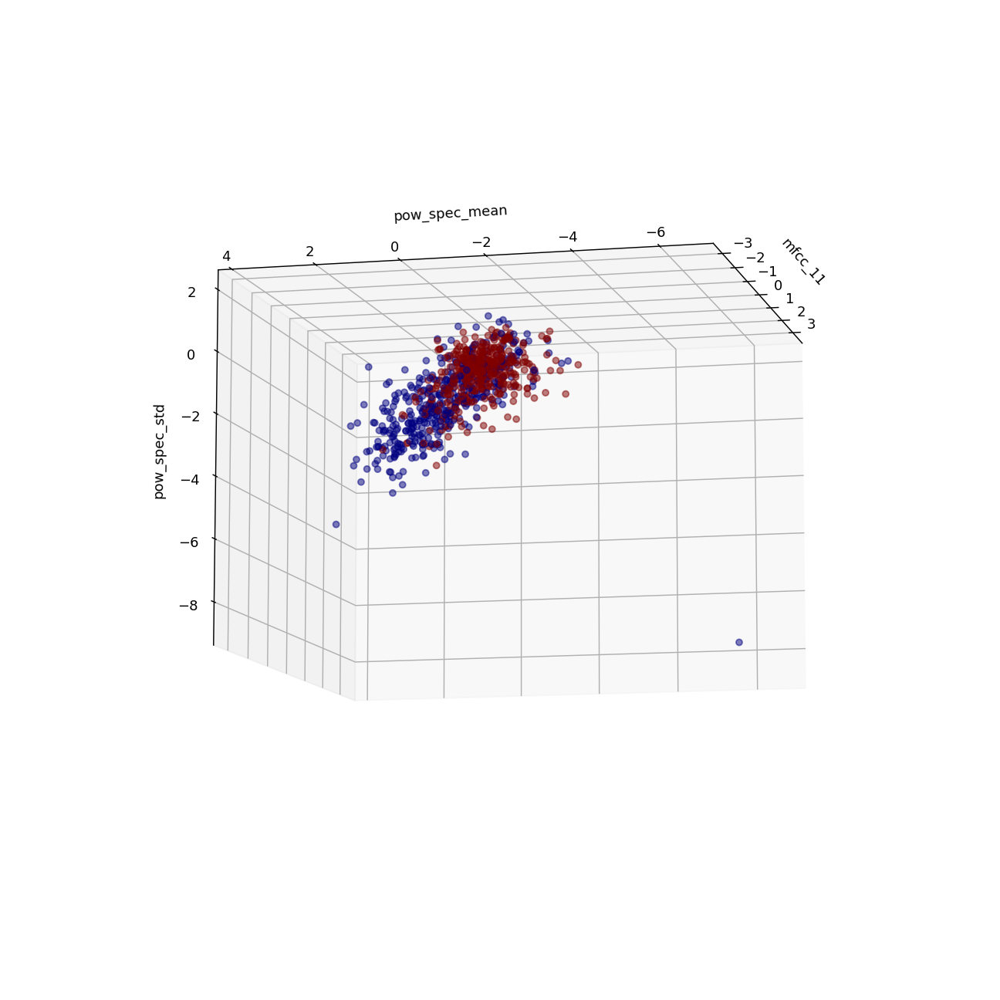

In [ ]:
%matplotlib notebook
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
p = ax.scatter(short_list.iloc[:,0],short_list.iloc[:,1],short_list.iloc[:,2],c=labels,cmap='jet', alpha=0.5)
ax.set_xlabel('mfcc_11')
ax.set_ylabel('pow_spec_mean')
ax.set_zlabel('pow_spec_std')
plt.show()

Looking at the different angles in this prediction space, we have something that should be linearly seperable, but it will contain some level of error. 

### 7.12 Decide on final feature set

Final features selected are:
- mfcc_11, 
- pow_spec_mean 
- pow_spec_std

### 7.13 Explore if more transformation would be of benefit

The graph below shows the normalised, untransformed predictor space. 

<IPython.core.display.Javascript object>


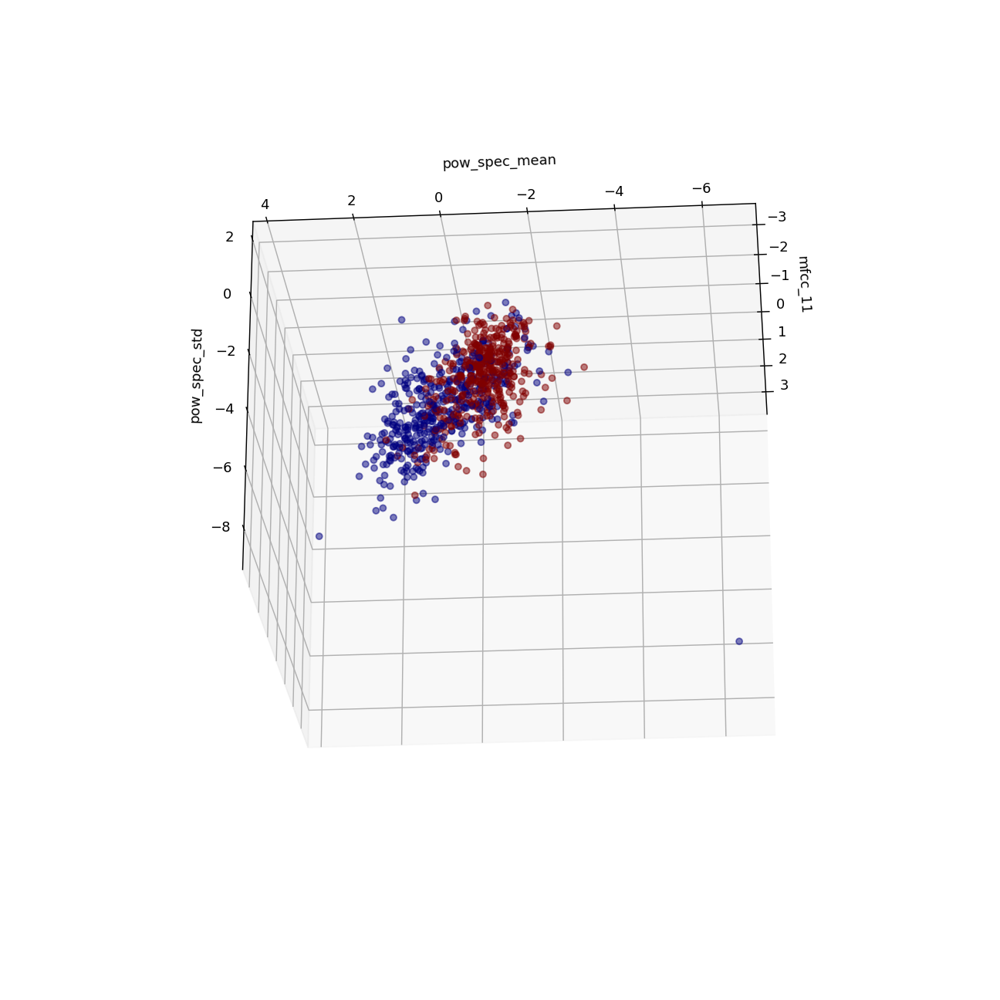

In [ ]:
%matplotlib notebook
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
p = ax.scatter(short_list.iloc[:,0],short_list.iloc[:,1],short_list.iloc[:,2],c=labels,cmap='jet', alpha=0.5)
ax.set_xlabel('mfcc_11')
ax.set_ylabel('pow_spec_mean')
ax.set_zlabel('pow_spec_std')
plt.show()

to explore if transformation via PCA would be of benefit, we can run it through and see what the explained_variance ratio tells us about the three features, and visualise the predictor space again

### How would PCA transformation change the predictor space?

In [ ]:
from sklearn.decomposition import PCA

columns_to_keep = ['mfcc_11','pow_spec_mean','pow_spec_std']
features = short_list[columns_to_keep].copy()
pca = PCA(n_components=3)
pca.fit(features)
three_features = pca.transform(features)

print(pca.explained_variance_ratio_)
print(pca.singular_values_)
print(pca.components_)

[0.60066541 0.32256074 0.07677385]
[38.51029594 28.22060377 13.76788399]
[[ 0.21281299  0.69710953 -0.68465242]
 [ 0.97329096 -0.08948732  0.21141603]
 [ 0.08611241 -0.71135809 -0.69753446]]


This last explained vaiance ratio does suggest that we might be able to remove the pow_spec_std. 
however I am relunctant to do this without some model evaluation first

<IPython.core.display.Javascript object>


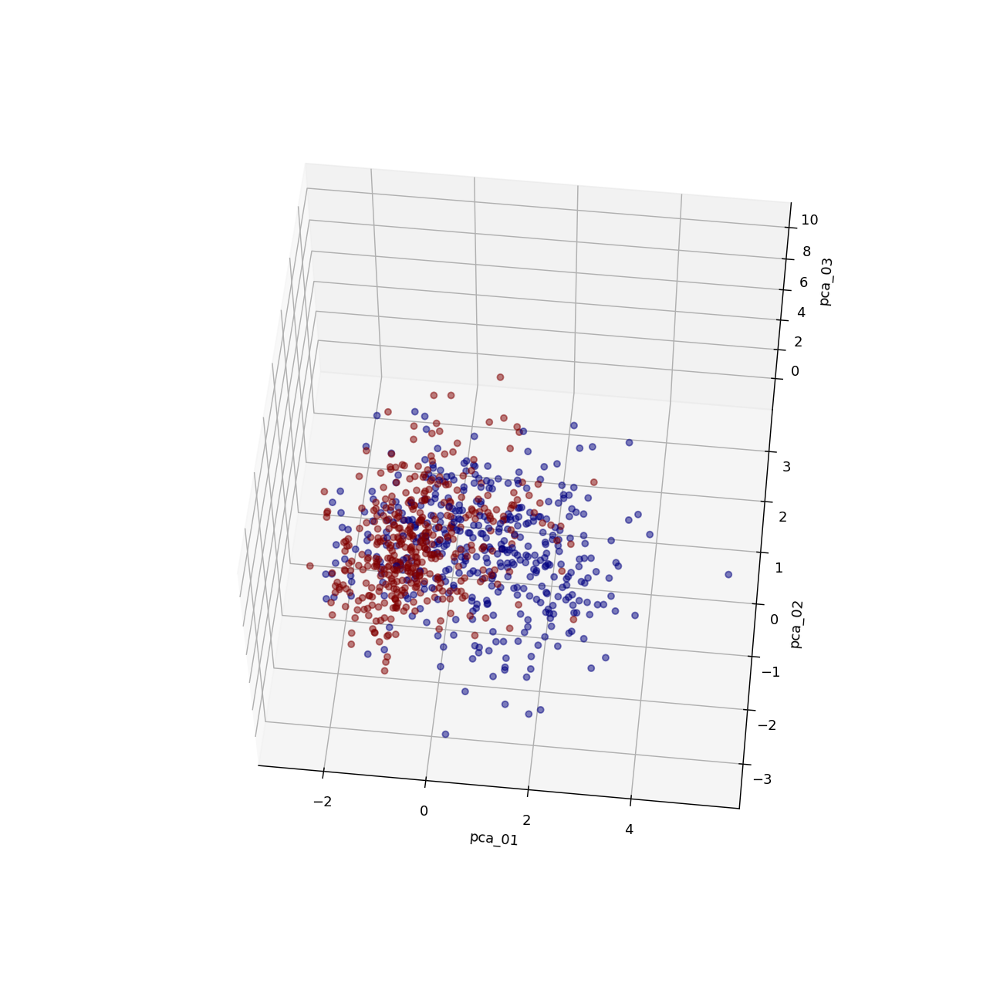

In [ ]:
%matplotlib notebook
#%matplotlib inline
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')

p = ax.scatter(three_features[:,0],three_features[:,1],three_features[:,2],c=labels,cmap='jet', alpha=0.5)
ax.set_xlabel('pca_01')
ax.set_ylabel('pca_02')
ax.set_zlabel('pca_03')

plt.show()

**Looking at this, I feel PCA actually distrupts the prediction sapce and will not be includeing this in my pipeline**

### 7.14 define the final data processing pipeline to be used for model selection
- Create a dataset ready for model selection experiments


### At this stage we are now ready to select the best model for features selected and our problem. 

- In the above section I have processed 2500 audio samples, creating 42 canditate features for assessment. 
- By looking at the distribution of each canditate feature when grouped by indoors label, we have removed canditates with little to no variation. 
- By pairplotting the remaining canditate features against each other, and colour mapping against indoors label we identified 2 sets of  canditate features which were explored in scatter plots. 
- this allowed us to define the smaller explore_set_2 which had 3 features
- finally by pairploting again and exploring different feature sets in 3d space, we were able to identify the best three features which appeared to have a harmonious effect in shaping the predictive space. 
- Finaly PCA analysis was invesitgated as a transformation, but rejects as it made the prediction space less useful. 

### We have now defined our data pipeline and transformation pipeline as:
- Identify the best 4 second subsample of each audio file
- extract the audio features from the selected sub sample
- normalise the data using a stand scaler. 
- the final features used in this data pipeline are:
    - mfcc_11
    - pow_spec_mean
    - pow_spec_std

### create a dataset for use in model selection experiments

In [ ]:
feature_set = ['mfcc_11', 'pow_spec_mean', 'pow_spec_std', 'Indoors']
finalset = full_df[feature_set].copy()
display(finalset)

,mfcc_11,pow_spec_mean,pow_spec_std,Indoors
0,-3.311075,0.446272,0.274280,False
1,-3.311639,0.486211,0.277349,False
2,-2.779424,0.516873,0.250180,True
3,-20.192146,0.476007,0.264075,True
4,-9.690632,0.583383,0.252923,True
...,...,...,...,...
2495,-10.384540,0.421697,0.289278,True
2496,-5.867772,0.548140,0.246723,True
2497,-12.645845,0.494310,0.272770,True
2498,5.051126,0.612144,0.223814,False


# 8 Results

Carry out your experiments here, explain your results.

### 8.01 Split the un-normalized dataset into train and test sets
- Use a 70/30 split holding back 30% of the samples for final evaluation. 
- Take 70% of the data for model evaluation. 


In [ ]:
from sklearn import svm
from sklearn.model_selection import train_test_split

X_train_unscaled, X_val_unscaled, y_train, y_val = train_test_split(finalset.iloc[:,:-1].to_numpy(),finalset.iloc[:,-1].to_numpy(),test_size=0.3, random_state = 42)
print(X_train_unscaled.shape, X_val_unscaled.shape, y_train.shape, y_val.shape)
print(y_train[:10])


(1750, 3) (750, 3) (1750,) (750,)
[ True  True False  True  True False  True False False  True]


### 8.02 Use a standard scaler to normalise the data
- This will re-create the predictor space we have visualised, but with new mean and standard deviation based only the X_train dataset
- this ensures that the mean or Std of the whole set does not leak into the model testing. 
- all models will be fitted using the mean and std of the 70% train dataset. 

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train_unscaled)
X_train = scaler.transform(X_train_unscaled)

### 8.03 create helper functions for the model testing
- cross_val_predict() uses sklearn KFold() to complete k fold cross validation, but also records the predicted labels from each fold when it is being used as validators. This allows us to get a confusion matrix off the entire X_train dataset.  
- matrix_and_results() takes the actual labels and predicted labels from cross_val_predict(), turning them into a confusion matrix, sensitivity, specificity, positive predictive value and negative predictive value. 


In [ ]:
# after https://towardsdatascience.com/how-to-plot-a-confusion-matrix-from-a-k-fold-cross-validation-b607317e9874
import copy as cp
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
%matplotlib inline
import seaborn as sns
from typing import Tuple
from sklearn.metrics import confusion_matrix

def cross_val_predict(model, kfold : KFold, X : np.array, y : np.array) -> Tuple[np.array, np.array]:
    # create variables for kfold to use
    model_ = cp.deepcopy(model)
    number_of_labels = len(np.unique(y))
    actual_labels = np.empty([0], dtype=int)
    predicted_labels = np.empty([0], dtype=int)

    # the the kfold.split to biuld the full list of actual and predicted labels
    # gives the indexs for this fold
    for train_indexs, test_indexs in kfold.split(X):

        train_X, train_y, test_X, test_y = X[train_indexs], y[train_indexs], X[test_indexs], y[test_indexs]
        # get the labels from the y_train
        actual_labels = np.append(actual_labels, test_y)
        # make predictions for is fold's indexs
        model_.fit(train_X, train_y)
        predicted_labels = np.append(predicted_labels, model_.predict(test_X))
    
    # return the full list of actual and predicted
    return actual_labels, predicted_labels



In [ ]:
def matrix_and_results(actual: np.array, predicted: np.array, sorted_labels : list):
    
    matrix = confusion_matrix(actual, predicted, labels=sorted_labels)
    
    plt.figure(figsize=(5,3))
    sns.heatmap(matrix, annot=True, xticklabels=sorted_labels, yticklabels=sorted_labels, cmap="Blues", fmt="g")
    plt.xlabel('Predicted'); plt.ylabel('Actual'); plt.title('Confusion Matrix')

    plt.show()
    
    true_postives = matrix[0][0]
    true_negatives = matrix[1][1]
    false_postives = matrix[0][1]
    false_negatives = matrix[1][0]
    print('true_postives', true_postives)
    print('true_negatives', true_negatives)
    print('false_postives', false_postives)
    print('false_negatives', false_negatives)
    sensitivity = true_postives / (true_postives+false_negatives)
    print('sensitivity',sensitivity, "to predict indoors, when the sample was recorded indoors")
    specificity = true_negatives / (true_negatives+false_postives)
    print('specificity',specificity , "to predict outdoors, when the sample was recorded outdoors")
    ppv = true_postives / (true_postives+false_postives)
    print('Postive Predictive value',ppv , "that a predicted indoors is really an indoors recording")
    npv = true_negatives / (true_negatives+false_negatives)
    print('Negative Predictive value',npv , "that a predicted outdoors is really an outdoors recording")
    print("The ratio of false postives to false negatives is",false_postives/false_negatives)
    print("The ratio of false negatives to false postitives is",false_negatives/false_postives)
    if (false_postives/false_negatives)<1.5 and (false_negatives/false_postives)<1.5:
        print("This model meets the criteria of having less than 50% difference between classes for false predictions")
    print('')
    print('')

### an example of the type of output we can expect from each model training and cross validation

SVC(C=1.5, gamma=1.5, random_state=0)
0.72 accuracy with a standard deviation of 0.02
0.7217142857142858 0.018481099004338534


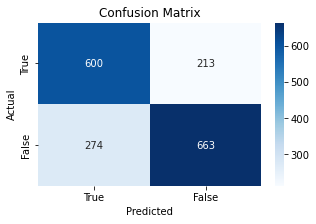

true_postives 600
true_negatives 663
false_postives 213
false_negatives 274
sensitivity 0.6864988558352403 to predict indoors, when the sample was recorded indoors
specificity 0.7568493150684932 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.7380073800738007 that a predicted indoors is really an indoors recording
Negative Predictive value 0.7075773745997865 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.7773722627737226
The ratio of false negatives to false postitives is 1.2863849765258215
This model meets the criteria of having less than 50% difference between classes for false predictions




In [ ]:
%matplotlib inline
from sklearn.svm import SVC
model = svm.SVC(C=1.5,gamma=1.5, random_state=0)
kfold = KFold(n_splits=5, random_state=0, shuffle=True)
cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring='accuracy')
print(model)
print("%0.2f accuracy with a standard deviation of %0.2f" % (cv_results.mean(), cv_results.std()))
print(cv_results.mean(), cv_results.std())

actual, predicted = cross_val_predict(model, kfold, X_train, y_train)

matrix_and_results(actual, predicted, [True, False])

## The next section of model evaluation will contain the following steps

### 8.04 Use k-fold cross validation to evaluate different models
- I have decided on a 5 fold cross validation strategy
- I have implemented a function which manages this process, but also keeps track of the true vs predicted labels whilst running 5 fold cross validation; these will be used in the next step of the training.
- print out the average accuracy and standard deviation of the model based on 5 fold validation. 

### 8.05 Calculate the confusion matrix for each model evaluation
- Take the true vs predicted labels for each model, calculate the confusion matric, along with sensitivity, specificity, positive predictive value and negative predictive value. 

### 8.06 Explore different hyper parameters of K-nearest_neighbour, Random Forrest Classifier, & Support Vector Machine models
- using the two sections above set up iterations of models which have hyper parameters.
- for K-nearest-Neighbour use odd numbers from 1 - 17.
- for C-Support Vector Classification loop through different C values and gamma values of the default 'rbf' and 'poly' kernels
- for Random Forest classifier change the number of estimators using 1, 3, 5, 10, 15, 20, 25, 50 and the default 100

### 8.07 Review ratio of false predictions (false negatives and false positives) between classes whilst looking to maximise overall accuracy
- After running training these models and using 5 fold cross validation to calculate the confusion matrix, 
- evaluate the best model from each family, and select the best 2 performing models. 
- Best performing will have a high accuracy and less than 50% difference in the ration of false prediction between classes

## Model evaluations



### 8.09 KNeighborsClassifier (with hyperparameter selection)

KNeighborsClassifier(n_neighbors=1)
0.65 accuracy with a standard deviation of 0.02


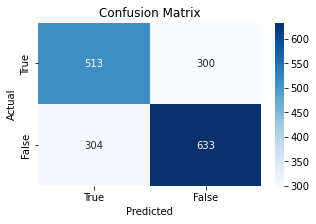

true_postives 513
true_negatives 633
false_postives 300
false_negatives 304
sensitivity 0.627906976744186 to predict indoors, when the sample was recorded indoors
specificity 0.6784565916398714 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.6309963099630996 that a predicted indoors is really an indoors recording
Negative Predictive value 0.6755602988260405 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.9868421052631579
The ratio of false negatives to false postitives is 1.0133333333333334
This model meets the criteria of having less than 50% difference between classes for false predictions


KNeighborsClassifier(n_neighbors=3)
0.66 accuracy with a standard deviation of 0.01


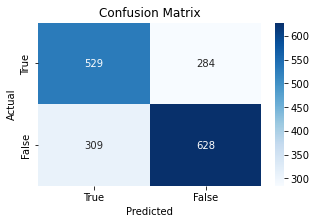

true_postives 529
true_negatives 628
false_postives 284
false_negatives 309
sensitivity 0.6312649164677804 to predict indoors, when the sample was recorded indoors
specificity 0.6885964912280702 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.6506765067650676 that a predicted indoors is really an indoors recording
Negative Predictive value 0.6702241195304163 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.919093851132686
The ratio of false negatives to false postitives is 1.0880281690140845
This model meets the criteria of having less than 50% difference between classes for false predictions


KNeighborsClassifier()
0.69 accuracy with a standard deviation of 0.01


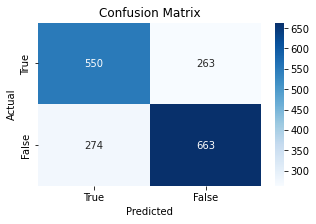

true_postives 550
true_negatives 663
false_postives 263
false_negatives 274
sensitivity 0.6674757281553398 to predict indoors, when the sample was recorded indoors
specificity 0.7159827213822895 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.6765067650676507 that a predicted indoors is really an indoors recording
Negative Predictive value 0.7075773745997865 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.9598540145985401
The ratio of false negatives to false postitives is 1.0418250950570342
This model meets the criteria of having less than 50% difference between classes for false predictions


KNeighborsClassifier(n_neighbors=7)
0.68 accuracy with a standard deviation of 0.01


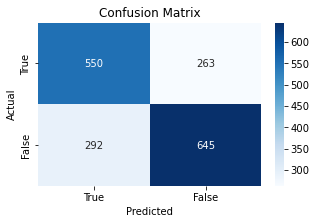

true_postives 550
true_negatives 645
false_postives 263
false_negatives 292
sensitivity 0.6532066508313539 to predict indoors, when the sample was recorded indoors
specificity 0.710352422907489 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.6765067650676507 that a predicted indoors is really an indoors recording
Negative Predictive value 0.688367129135539 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.9006849315068494
The ratio of false negatives to false postitives is 1.1102661596958174
This model meets the criteria of having less than 50% difference between classes for false predictions


KNeighborsClassifier(n_neighbors=9)
0.69 accuracy with a standard deviation of 0.01


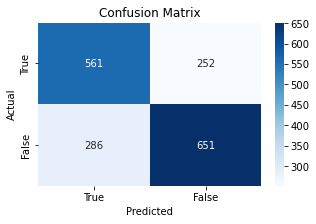

true_postives 561
true_negatives 651
false_postives 252
false_negatives 286
sensitivity 0.6623376623376623 to predict indoors, when the sample was recorded indoors
specificity 0.7209302325581395 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.6900369003690037 that a predicted indoors is really an indoors recording
Negative Predictive value 0.6947705442902882 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.8811188811188811
The ratio of false negatives to false postitives is 1.1349206349206349
This model meets the criteria of having less than 50% difference between classes for false predictions


KNeighborsClassifier(n_neighbors=11)
0.69 accuracy with a standard deviation of 0.01


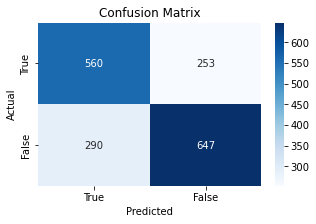

true_postives 560
true_negatives 647
false_postives 253
false_negatives 290
sensitivity 0.6588235294117647 to predict indoors, when the sample was recorded indoors
specificity 0.7188888888888889 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.6888068880688807 that a predicted indoors is really an indoors recording
Negative Predictive value 0.6905016008537886 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.8724137931034482
The ratio of false negatives to false postitives is 1.1462450592885376
This model meets the criteria of having less than 50% difference between classes for false predictions


KNeighborsClassifier(n_neighbors=13)
0.69 accuracy with a standard deviation of 0.01


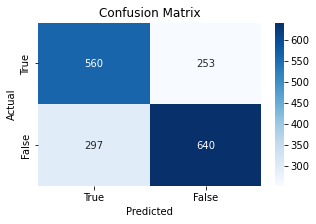

true_postives 560
true_negatives 640
false_postives 253
false_negatives 297
sensitivity 0.6534422403733956 to predict indoors, when the sample was recorded indoors
specificity 0.7166853303471444 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.6888068880688807 that a predicted indoors is really an indoors recording
Negative Predictive value 0.6830309498399146 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.8518518518518519
The ratio of false negatives to false postitives is 1.173913043478261
This model meets the criteria of having less than 50% difference between classes for false predictions


KNeighborsClassifier(n_neighbors=15)
0.69 accuracy with a standard deviation of 0.02


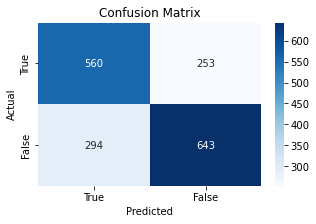

true_postives 560
true_negatives 643
false_postives 253
false_negatives 294
sensitivity 0.6557377049180327 to predict indoors, when the sample was recorded indoors
specificity 0.7176339285714286 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.6888068880688807 that a predicted indoors is really an indoors recording
Negative Predictive value 0.6862326574172892 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.8605442176870748
The ratio of false negatives to false postitives is 1.1620553359683794
This model meets the criteria of having less than 50% difference between classes for false predictions


KNeighborsClassifier(n_neighbors=17)
0.69 accuracy with a standard deviation of 0.02


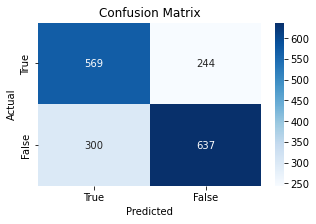

true_postives 569
true_negatives 637
false_postives 244
false_negatives 300
sensitivity 0.6547756041426928 to predict indoors, when the sample was recorded indoors
specificity 0.7230419977298524 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.6998769987699877 that a predicted indoors is really an indoors recording
Negative Predictive value 0.67982924226254 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.8133333333333334
The ratio of false negatives to false postitives is 1.2295081967213115
This model meets the criteria of having less than 50% difference between classes for false predictions




In [ ]:

import warnings
warnings.filterwarnings(action='ignore', category=FutureWarning) # setting ignore as a parameter and further adding category
%matplotlib inline

from sklearn.neighbors import KNeighborsClassifier
knum = [1, 3, 5, 7, 9, 11, 13, 15, 17]
for k in knum:
    model = KNeighborsClassifier(n_neighbors=k)
    model.fit(X_train, y_train)

    kfold = KFold(n_splits=5, random_state=0, shuffle=True)
    cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring='accuracy')
    print(model)
    print("%0.2f accuracy with a standard deviation of %0.2f" % (cv_results.mean(), cv_results.std()))
    actual_classes, predicted_classes = cross_val_predict(model, kfold, X_train, y_train)
    matrix_and_results(actual_classes, predicted_classes, [True, False])




The best model in this family is:
KNeighborsClassifier(n_neighbors=9)


**Discussion** 
- The KNeighborsClassifier has an accuracy of 69%, 
- it satisfies our success criteria of less than a 50% difference in false positives and false negatives

see the cell below for the output of this model


KNeighborsClassifier(n_neighbors=9)
0.69 accuracy with a standard deviation of 0.01


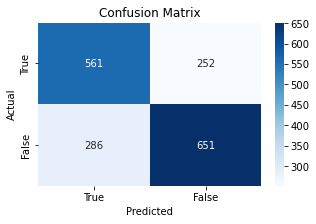

true_postives 561
true_negatives 651
false_postives 252
false_negatives 286
sensitivity 0.6623376623376623 to predict indoors, when the sample was recorded indoors
specificity 0.7209302325581395 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.6900369003690037 that a predicted indoors is really an indoors recording
Negative Predictive value 0.6947705442902882 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.8811188811188811
The ratio of false negatives to false postitives is 1.1349206349206349
This model meets the criteria of having less than 50% difference between classes for false predictions




In [ ]:
model = KNeighborsClassifier(n_neighbors=9)
model.fit(X_train, y_train)

kfold = KFold(n_splits=5, random_state=0, shuffle=True)
cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring='accuracy')
print(model)
print("%0.2f accuracy with a standard deviation of %0.2f" % (cv_results.mean(), cv_results.std()))
actual_classes, predicted_classes = cross_val_predict(model, kfold, X_train, y_train)
matrix_and_results(actual_classes, predicted_classes, [True, False])

### 8.10 RandomForestClassifier (with hyperparameter selection)

RandomForestClassifier(n_estimators=1, random_state=0)
0.63 accuracy with a standard deviation of 0.02


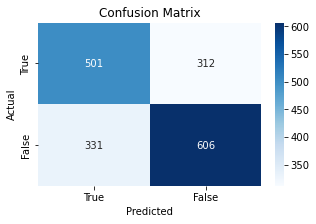

true_postives 501
true_negatives 606
false_postives 312
false_negatives 331
sensitivity 0.6021634615384616 to predict indoors, when the sample was recorded indoors
specificity 0.6601307189542484 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.6162361623616236 that a predicted indoors is really an indoors recording
Negative Predictive value 0.6467449306296692 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.9425981873111783
The ratio of false negatives to false postitives is 1.060897435897436
This model meets the criteria of having less than 50% difference between classes for false predictions


RandomForestClassifier(n_estimators=3, random_state=0)
0.67 accuracy with a standard deviation of 0.01


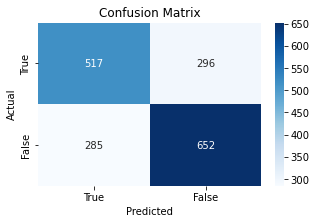

true_postives 517
true_negatives 652
false_postives 296
false_negatives 285
sensitivity 0.6446384039900249 to predict indoors, when the sample was recorded indoors
specificity 0.6877637130801688 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.6359163591635917 that a predicted indoors is really an indoors recording
Negative Predictive value 0.695837780149413 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 1.03859649122807
The ratio of false negatives to false postitives is 0.9628378378378378
This model meets the criteria of having less than 50% difference between classes for false predictions


RandomForestClassifier(n_estimators=5, random_state=0)
0.68 accuracy with a standard deviation of 0.02


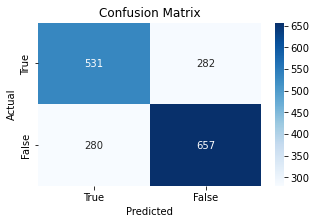

true_postives 531
true_negatives 657
false_postives 282
false_negatives 280
sensitivity 0.654747225647349 to predict indoors, when the sample was recorded indoors
specificity 0.6996805111821086 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.6531365313653137 that a predicted indoors is really an indoors recording
Negative Predictive value 0.7011739594450374 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 1.0071428571428571
The ratio of false negatives to false postitives is 0.9929078014184397
This model meets the criteria of having less than 50% difference between classes for false predictions


RandomForestClassifier(n_estimators=10, random_state=0)
0.69 accuracy with a standard deviation of 0.02


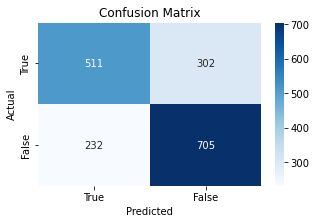

true_postives 511
true_negatives 705
false_postives 302
false_negatives 232
sensitivity 0.6877523553162853 to predict indoors, when the sample was recorded indoors
specificity 0.7000993048659384 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.6285362853628537 that a predicted indoors is really an indoors recording
Negative Predictive value 0.7524012806830309 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 1.3017241379310345
The ratio of false negatives to false postitives is 0.7682119205298014
This model meets the criteria of having less than 50% difference between classes for false predictions


RandomForestClassifier(n_estimators=15, random_state=0)
0.70 accuracy with a standard deviation of 0.01


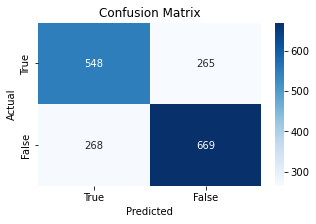

true_postives 548
true_negatives 669
false_postives 265
false_negatives 268
sensitivity 0.6715686274509803 to predict indoors, when the sample was recorded indoors
specificity 0.7162740899357601 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.6740467404674046 that a predicted indoors is really an indoors recording
Negative Predictive value 0.7139807897545357 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.9888059701492538
The ratio of false negatives to false postitives is 1.0113207547169811
This model meets the criteria of having less than 50% difference between classes for false predictions


RandomForestClassifier(n_estimators=20, random_state=0)
0.70 accuracy with a standard deviation of 0.01


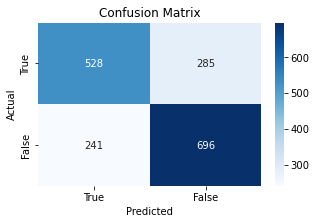

true_postives 528
true_negatives 696
false_postives 285
false_negatives 241
sensitivity 0.6866059817945384 to predict indoors, when the sample was recorded indoors
specificity 0.709480122324159 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.6494464944649446 that a predicted indoors is really an indoors recording
Negative Predictive value 0.7427961579509071 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 1.1825726141078838
The ratio of false negatives to false postitives is 0.8456140350877193
This model meets the criteria of having less than 50% difference between classes for false predictions


RandomForestClassifier(n_estimators=25, random_state=0)
0.70 accuracy with a standard deviation of 0.02


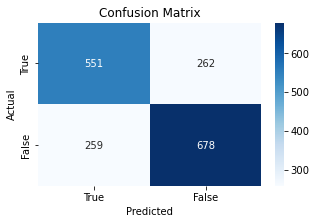

true_postives 551
true_negatives 678
false_postives 262
false_negatives 259
sensitivity 0.6802469135802469 to predict indoors, when the sample was recorded indoors
specificity 0.7212765957446808 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.6777367773677737 that a predicted indoors is really an indoors recording
Negative Predictive value 0.7235859124866596 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 1.0115830115830116
The ratio of false negatives to false postitives is 0.9885496183206107
This model meets the criteria of having less than 50% difference between classes for false predictions


RandomForestClassifier(n_estimators=50, random_state=0)
0.70 accuracy with a standard deviation of 0.01


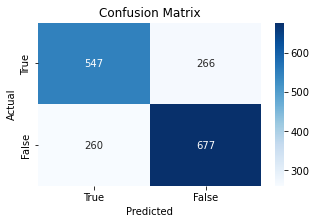

true_postives 547
true_negatives 677
false_postives 266
false_negatives 260
sensitivity 0.677819083023544 to predict indoors, when the sample was recorded indoors
specificity 0.7179215270413574 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.6728167281672817 that a predicted indoors is really an indoors recording
Negative Predictive value 0.7225186766275347 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 1.023076923076923
The ratio of false negatives to false postitives is 0.9774436090225563
This model meets the criteria of having less than 50% difference between classes for false predictions


RandomForestClassifier(random_state=0)
0.70 accuracy with a standard deviation of 0.02


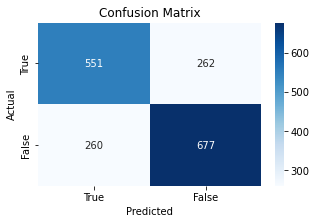

true_postives 551
true_negatives 677
false_postives 262
false_negatives 260
sensitivity 0.6794081381011098 to predict indoors, when the sample was recorded indoors
specificity 0.7209797657082002 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.6777367773677737 that a predicted indoors is really an indoors recording
Negative Predictive value 0.7225186766275347 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 1.0076923076923077
The ratio of false negatives to false postitives is 0.9923664122137404
This model meets the criteria of having less than 50% difference between classes for false predictions




In [ ]:
from sklearn.model_selection import KFold, cross_val_score
from sklearn.ensemble import RandomForestClassifier
n_estimators = [1, 3, 5, 10, 15, 20, 25, 50, 100]
for estimator in n_estimators:
    
    model = RandomForestClassifier(n_estimators=estimator , random_state=0)
    kfold = KFold(n_splits=5, random_state=0, shuffle=True)
    cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring='accuracy')
    print(model)
    print("%0.2f accuracy with a standard deviation of %0.2f" % (cv_results.mean(), cv_results.std()))
    actual_classes, predicted_classes = cross_val_predict(model, kfold, X_train, y_train)
    matrix_and_results(actual_classes, predicted_classes, [True, False])


The best model from this family is:

RandomForestClassifier(n_estimators=15, random_state=0)
- see the cell below the the output of this model

**Discussion** 
- The RandomForestClassifier has an accuracy of 70%, 
- The model satisfies our success criteria of less than a 50% difference in false positives and false negatives

RandomForestClassifier(n_estimators=15, random_state=0)
0.70 accuracy with a standard deviation of 0.01


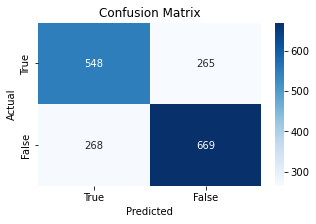

true_postives 548
true_negatives 669
false_postives 265
false_negatives 268
sensitivity 0.6715686274509803 to predict indoors, when the sample was recorded indoors
specificity 0.7162740899357601 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.6740467404674046 that a predicted indoors is really an indoors recording
Negative Predictive value 0.7139807897545357 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.9888059701492538
The ratio of false negatives to false postitives is 1.0113207547169811
This model meets the criteria of having less than 50% difference between classes for false predictions




In [ ]:
model = RandomForestClassifier(n_estimators=15 , random_state=0)
kfold = KFold(n_splits=5, random_state=0, shuffle=True)
cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring='accuracy')
print(model)
print("%0.2f accuracy with a standard deviation of %0.2f" % (cv_results.mean(), cv_results.std()))
actual_classes, predicted_classes = cross_val_predict(model, kfold, X_train, y_train)
matrix_and_results(actual_classes, predicted_classes, [True, False])

### 8.11 C-Support Vector Classification

C= 0.5 Gamma= 0.2
SVC(C=0.5, gamma=0.2)
0.72 accuracy with a standard deviation of 0.02
0.7177142857142857 0.022814245460202436


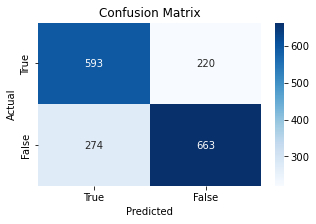

true_postives 593
true_negatives 663
false_postives 220
false_negatives 274
sensitivity 0.6839677047289504 to predict indoors, when the sample was recorded indoors
specificity 0.7508493771234428 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.7293972939729397 that a predicted indoors is really an indoors recording
Negative Predictive value 0.7075773745997865 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.8029197080291971
The ratio of false negatives to false postitives is 1.2454545454545454
This model meets the criteria of having less than 50% difference between classes for false predictions


C= 0.5 Gamma= 0.5
SVC(C=0.5, gamma=0.5)
0.71 accuracy with a standard deviation of 0.03
0.7148571428571429 0.02706907264531889


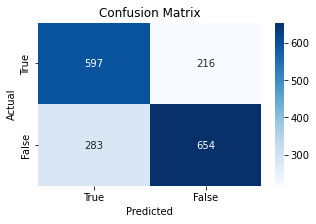

true_postives 597
true_negatives 654
false_postives 216
false_negatives 283
sensitivity 0.678409090909091 to predict indoors, when the sample was recorded indoors
specificity 0.7517241379310344 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.7343173431734318 that a predicted indoors is really an indoors recording
Negative Predictive value 0.6979722518676628 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.7632508833922261
The ratio of false negatives to false postitives is 1.3101851851851851
This model meets the criteria of having less than 50% difference between classes for false predictions


C= 0.5 Gamma= 1.0
SVC(C=0.5, gamma=1.0)
0.72 accuracy with a standard deviation of 0.02
0.7188571428571429 0.024149196124703363


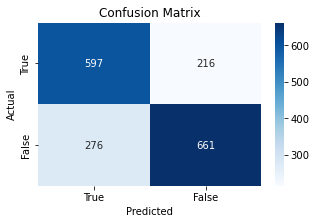

true_postives 597
true_negatives 661
false_postives 216
false_negatives 276
sensitivity 0.6838487972508591 to predict indoors, when the sample was recorded indoors
specificity 0.7537058152793614 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.7343173431734318 that a predicted indoors is really an indoors recording
Negative Predictive value 0.7054429028815368 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.782608695652174
The ratio of false negatives to false postitives is 1.2777777777777777
This model meets the criteria of having less than 50% difference between classes for false predictions


C= 0.5 Gamma= 1.5
SVC(C=0.5, gamma=1.5)
0.72 accuracy with a standard deviation of 0.02
0.7182857142857143 0.022101805263787085


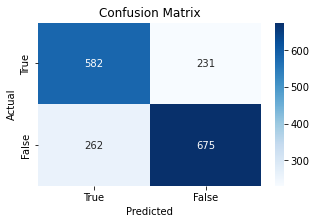

true_postives 582
true_negatives 675
false_postives 231
false_negatives 262
sensitivity 0.6895734597156398 to predict indoors, when the sample was recorded indoors
specificity 0.7450331125827815 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.7158671586715867 that a predicted indoors is really an indoors recording
Negative Predictive value 0.7203842049092849 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.8816793893129771
The ratio of false negatives to false postitives is 1.1341991341991342
This model meets the criteria of having less than 50% difference between classes for false predictions


C= 0.5 Gamma= 2.0
SVC(C=0.5, gamma=2.0)
0.72 accuracy with a standard deviation of 0.02
0.7177142857142856 0.018551637806569054


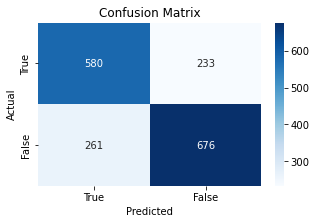

true_postives 580
true_negatives 676
false_postives 233
false_negatives 261
sensitivity 0.6896551724137931 to predict indoors, when the sample was recorded indoors
specificity 0.7436743674367436 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.7134071340713407 that a predicted indoors is really an indoors recording
Negative Predictive value 0.7214514407684098 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.89272030651341
The ratio of false negatives to false postitives is 1.1201716738197425
This model meets the criteria of having less than 50% difference between classes for false predictions


C= 1.5 Gamma= 0.2
SVC(C=1.5, gamma=0.2)
0.72 accuracy with a standard deviation of 0.03
0.7234285714285715 0.025644349339790706


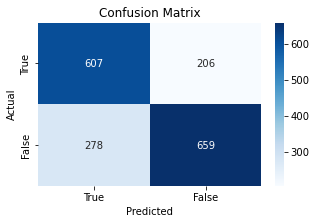

true_postives 607
true_negatives 659
false_postives 206
false_negatives 278
sensitivity 0.6858757062146893 to predict indoors, when the sample was recorded indoors
specificity 0.761849710982659 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.7466174661746617 that a predicted indoors is really an indoors recording
Negative Predictive value 0.7033084311632871 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.7410071942446043
The ratio of false negatives to false postitives is 1.3495145631067962
This model meets the criteria of having less than 50% difference between classes for false predictions


C= 1.5 Gamma= 0.5
SVC(C=1.5, gamma=0.5)
0.72 accuracy with a standard deviation of 0.03
0.7194285714285715 0.026948173994403638


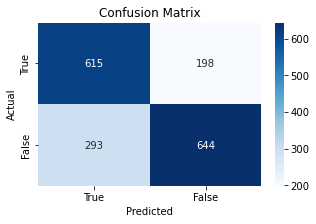

true_postives 615
true_negatives 644
false_postives 198
false_negatives 293
sensitivity 0.6773127753303965 to predict indoors, when the sample was recorded indoors
specificity 0.7648456057007126 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.7564575645756457 that a predicted indoors is really an indoors recording
Negative Predictive value 0.687299893276414 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.6757679180887372
The ratio of false negatives to false postitives is 1.47979797979798
This model meets the criteria of having less than 50% difference between classes for false predictions


C= 1.5 Gamma= 1.0
SVC(C=1.5, gamma=1.0)
0.72 accuracy with a standard deviation of 0.02
0.7188571428571429 0.024551486924503832


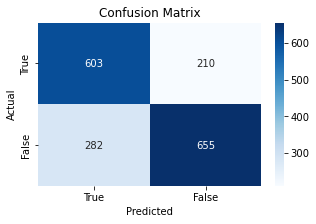

true_postives 603
true_negatives 655
false_postives 210
false_negatives 282
sensitivity 0.6813559322033899 to predict indoors, when the sample was recorded indoors
specificity 0.7572254335260116 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.7416974169741697 that a predicted indoors is really an indoors recording
Negative Predictive value 0.6990394877267876 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.7446808510638298
The ratio of false negatives to false postitives is 1.3428571428571427
This model meets the criteria of having less than 50% difference between classes for false predictions


C= 1.5 Gamma= 1.5
SVC(C=1.5, gamma=1.5)
0.72 accuracy with a standard deviation of 0.02
0.7217142857142858 0.018481099004338534


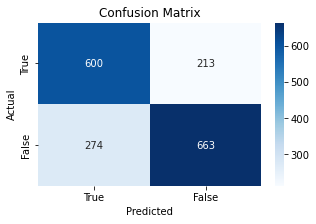

true_postives 600
true_negatives 663
false_postives 213
false_negatives 274
sensitivity 0.6864988558352403 to predict indoors, when the sample was recorded indoors
specificity 0.7568493150684932 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.7380073800738007 that a predicted indoors is really an indoors recording
Negative Predictive value 0.7075773745997865 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.7773722627737226
The ratio of false negatives to false postitives is 1.2863849765258215
This model meets the criteria of having less than 50% difference between classes for false predictions


C= 1.5 Gamma= 2.0
SVC(C=1.5, gamma=2.0)
0.72 accuracy with a standard deviation of 0.02
0.7194285714285715 0.01837478307521545


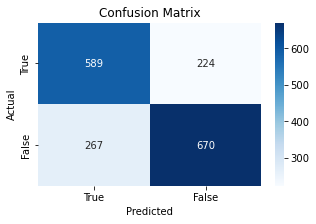

true_postives 589
true_negatives 670
false_postives 224
false_negatives 267
sensitivity 0.6880841121495327 to predict indoors, when the sample was recorded indoors
specificity 0.7494407158836689 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.7244772447724477 that a predicted indoors is really an indoors recording
Negative Predictive value 0.7150480256136607 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.8389513108614233
The ratio of false negatives to false postitives is 1.1919642857142858
This model meets the criteria of having less than 50% difference between classes for false predictions


C= 2.5 Gamma= 0.2
SVC(C=2.5, gamma=0.2)
0.72 accuracy with a standard deviation of 0.03
0.724 0.02597329869111658


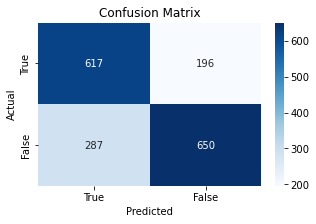

true_postives 617
true_negatives 650
false_postives 196
false_negatives 287
sensitivity 0.6825221238938053 to predict indoors, when the sample was recorded indoors
specificity 0.7683215130023641 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.7589175891758918 that a predicted indoors is really an indoors recording
Negative Predictive value 0.6937033084311632 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.6829268292682927
The ratio of false negatives to false postitives is 1.4642857142857142
This model meets the criteria of having less than 50% difference between classes for false predictions


C= 2.5 Gamma= 0.5
SVC(C=2.5, gamma=0.5)
0.72 accuracy with a standard deviation of 0.03
0.7245714285714285 0.027618390796787573


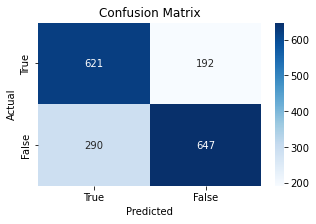

true_postives 621
true_negatives 647
false_postives 192
false_negatives 290
sensitivity 0.681668496158068 to predict indoors, when the sample was recorded indoors
specificity 0.7711561382598331 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.7638376383763837 that a predicted indoors is really an indoors recording
Negative Predictive value 0.6905016008537886 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.6620689655172414
The ratio of false negatives to false postitives is 1.5104166666666667


C= 2.5 Gamma= 1.0
SVC(C=2.5, gamma=1.0)
0.72 accuracy with a standard deviation of 0.02
0.7205714285714284 0.02267066791414555


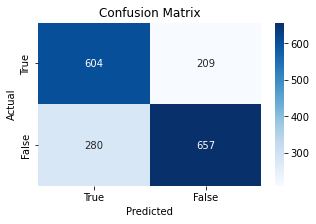

true_postives 604
true_negatives 657
false_postives 209
false_negatives 280
sensitivity 0.6832579185520362 to predict indoors, when the sample was recorded indoors
specificity 0.7586605080831409 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.7429274292742928 that a predicted indoors is really an indoors recording
Negative Predictive value 0.7011739594450374 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.7464285714285714
The ratio of false negatives to false postitives is 1.3397129186602872
This model meets the criteria of having less than 50% difference between classes for false predictions


C= 2.5 Gamma= 1.5
SVC(C=2.5, gamma=1.5)
0.72 accuracy with a standard deviation of 0.02
0.7182857142857143 0.019003759026646746


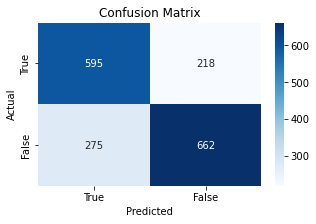

true_postives 595
true_negatives 662
false_postives 218
false_negatives 275
sensitivity 0.6839080459770115 to predict indoors, when the sample was recorded indoors
specificity 0.7522727272727273 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.7318573185731857 that a predicted indoors is really an indoors recording
Negative Predictive value 0.7065101387406617 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.7927272727272727
The ratio of false negatives to false postitives is 1.261467889908257
This model meets the criteria of having less than 50% difference between classes for false predictions


C= 2.5 Gamma= 2.0
SVC(C=2.5, gamma=2.0)
0.71 accuracy with a standard deviation of 0.02
0.7148571428571429 0.019910001588782106


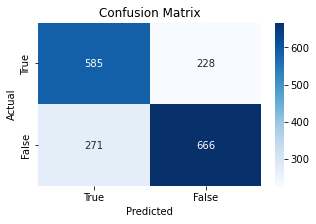

true_postives 585
true_negatives 666
false_postives 228
false_negatives 271
sensitivity 0.6834112149532711 to predict indoors, when the sample was recorded indoors
specificity 0.7449664429530202 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.7195571955719557 that a predicted indoors is really an indoors recording
Negative Predictive value 0.7107790821771611 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.8413284132841329
The ratio of false negatives to false postitives is 1.1885964912280702
This model meets the criteria of having less than 50% difference between classes for false predictions


C= 3.5 Gamma= 0.2
SVC(C=3.5, gamma=0.2)
0.73 accuracy with a standard deviation of 0.02
0.7251428571428571 0.024203221239482715


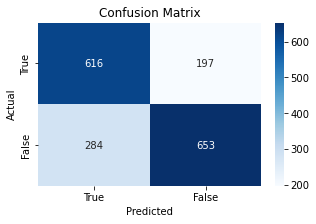

true_postives 616
true_negatives 653
false_postives 197
false_negatives 284
sensitivity 0.6844444444444444 to predict indoors, when the sample was recorded indoors
specificity 0.768235294117647 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.7576875768757687 that a predicted indoors is really an indoors recording
Negative Predictive value 0.6969050160085379 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.6936619718309859
The ratio of false negatives to false postitives is 1.4416243654822336
This model meets the criteria of having less than 50% difference between classes for false predictions


C= 3.5 Gamma= 0.5
SVC(C=3.5, gamma=0.5)
0.72 accuracy with a standard deviation of 0.03
0.7234285714285714 0.028537122260991473


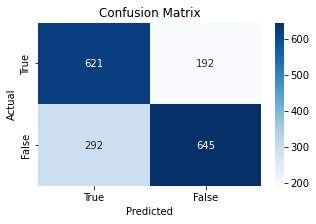

true_postives 621
true_negatives 645
false_postives 192
false_negatives 292
sensitivity 0.6801752464403067 to predict indoors, when the sample was recorded indoors
specificity 0.7706093189964157 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.7638376383763837 that a predicted indoors is really an indoors recording
Negative Predictive value 0.688367129135539 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.6575342465753424
The ratio of false negatives to false postitives is 1.5208333333333333


C= 3.5 Gamma= 1.0
SVC(C=3.5, gamma=1.0)
0.72 accuracy with a standard deviation of 0.02
0.72 0.02264184314989592


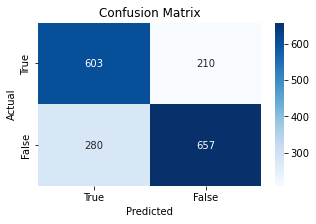

true_postives 603
true_negatives 657
false_postives 210
false_negatives 280
sensitivity 0.6828992072480181 to predict indoors, when the sample was recorded indoors
specificity 0.7577854671280276 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.7416974169741697 that a predicted indoors is really an indoors recording
Negative Predictive value 0.7011739594450374 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.75
The ratio of false negatives to false postitives is 1.3333333333333333
This model meets the criteria of having less than 50% difference between classes for false predictions


C= 3.5 Gamma= 1.5
SVC(C=3.5, gamma=1.5)
0.72 accuracy with a standard deviation of 0.02
0.7182857142857143 0.0202514801676221


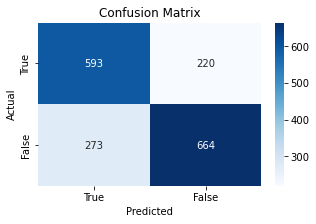

true_postives 593
true_negatives 664
false_postives 220
false_negatives 273
sensitivity 0.684757505773672 to predict indoors, when the sample was recorded indoors
specificity 0.751131221719457 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.7293972939729397 that a predicted indoors is really an indoors recording
Negative Predictive value 0.7086446104589115 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.8058608058608059
The ratio of false negatives to false postitives is 1.240909090909091
This model meets the criteria of having less than 50% difference between classes for false predictions


C= 3.5 Gamma= 2.0
SVC(C=3.5, gamma=2.0)
0.71 accuracy with a standard deviation of 0.02
0.7125714285714286 0.018917651836853542


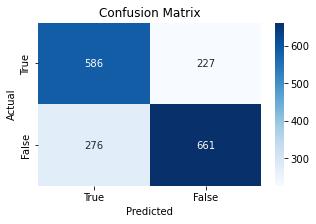

true_postives 586
true_negatives 661
false_postives 227
false_negatives 276
sensitivity 0.679814385150812 to predict indoors, when the sample was recorded indoors
specificity 0.7443693693693694 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.7207872078720787 that a predicted indoors is really an indoors recording
Negative Predictive value 0.7054429028815368 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.822463768115942
The ratio of false negatives to false postitives is 1.2158590308370043
This model meets the criteria of having less than 50% difference between classes for false predictions


C= 4.5 Gamma= 0.2
SVC(C=4.5, gamma=0.2)
0.72 accuracy with a standard deviation of 0.03
0.7228571428571428 0.02958212366981666


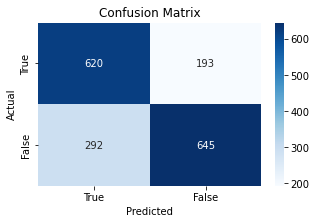

true_postives 620
true_negatives 645
false_postives 193
false_negatives 292
sensitivity 0.6798245614035088 to predict indoors, when the sample was recorded indoors
specificity 0.7696897374701671 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.7626076260762608 that a predicted indoors is really an indoors recording
Negative Predictive value 0.688367129135539 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.660958904109589
The ratio of false negatives to false postitives is 1.5129533678756477


C= 4.5 Gamma= 0.5
SVC(C=4.5, gamma=0.5)
0.72 accuracy with a standard deviation of 0.03
0.7217142857142858 0.02622352892704861


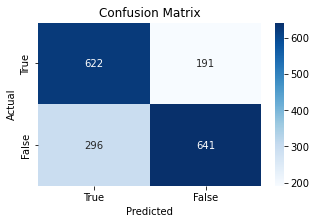

true_postives 622
true_negatives 641
false_postives 191
false_negatives 296
sensitivity 0.6775599128540305 to predict indoors, when the sample was recorded indoors
specificity 0.7704326923076923 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.7650676506765067 that a predicted indoors is really an indoors recording
Negative Predictive value 0.6840981856990395 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.6452702702702703
The ratio of false negatives to false postitives is 1.549738219895288


C= 4.5 Gamma= 1.0
SVC(C=4.5, gamma=1.0)
0.72 accuracy with a standard deviation of 0.02
0.7177142857142857 0.02163896711858454


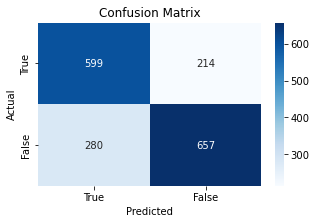

true_postives 599
true_negatives 657
false_postives 214
false_negatives 280
sensitivity 0.6814562002275313 to predict indoors, when the sample was recorded indoors
specificity 0.7543053960964409 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.7367773677736777 that a predicted indoors is really an indoors recording
Negative Predictive value 0.7011739594450374 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.7642857142857142
The ratio of false negatives to false postitives is 1.308411214953271
This model meets the criteria of having less than 50% difference between classes for false predictions


C= 4.5 Gamma= 1.5
SVC(C=4.5, gamma=1.5)
0.72 accuracy with a standard deviation of 0.02
0.7165714285714285 0.016303248705928114


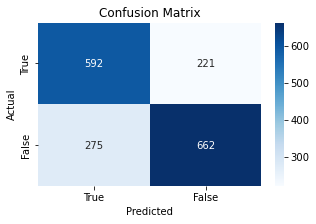

true_postives 592
true_negatives 662
false_postives 221
false_negatives 275
sensitivity 0.6828143021914648 to predict indoors, when the sample was recorded indoors
specificity 0.7497168742921857 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.7281672816728167 that a predicted indoors is really an indoors recording
Negative Predictive value 0.7065101387406617 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.8036363636363636
The ratio of false negatives to false postitives is 1.244343891402715
This model meets the criteria of having less than 50% difference between classes for false predictions


C= 4.5 Gamma= 2.0
SVC(C=4.5, gamma=2.0)
0.71 accuracy with a standard deviation of 0.02
0.7102857142857143 0.015183234577813075


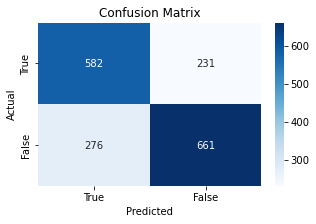

true_postives 582
true_negatives 661
false_postives 231
false_negatives 276
sensitivity 0.6783216783216783 to predict indoors, when the sample was recorded indoors
specificity 0.7410313901345291 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.7158671586715867 that a predicted indoors is really an indoors recording
Negative Predictive value 0.7054429028815368 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.8369565217391305
The ratio of false negatives to false postitives is 1.1948051948051948
This model meets the criteria of having less than 50% difference between classes for false predictions




In [ ]:
c_list = [0.5, 1.5, 2.5, 3.5, 4.5]
g_list = [0.2, 0.5, 1.0, 1.5, 2.0]

for c in c_list:
    for g in g_list:
        print("C=",c, "Gamma=", g)
        
        model  = svm.SVC(C=c,gamma=g)
        model.fit(X_train,y_train)
        kfold = KFold(n_splits=5, random_state=0, shuffle=True)
        cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring='accuracy')
        print(model)
        print("%0.2f accuracy with a standard deviation of %0.2f" % (cv_results.mean(), cv_results.std()))
        print(cv_results.mean(), cv_results.std())
        actual_classes, predicted_classes = cross_val_predict(model, kfold, X_train, y_train)
        matrix_and_results(actual_classes, predicted_classes, [True, False])




**The best model from this family is:**

SVC(C=3.5, gamma=0.2)
- see the cell below for the output of this model

**Discussion** 

- The C-Support Vector Classification has an accuracy of 73%, 
- The model satisfies our success criteria of less than a 50% difference in false positives and false negatives

SVC(C=3.5, gamma=0.2)
0.73 accuracy with a standard deviation of 0.02
0.7251428571428571 0.024203221239482715


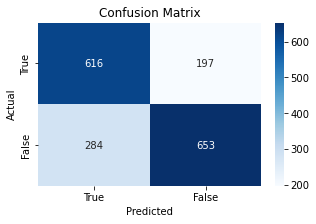

true_postives 616
true_negatives 653
false_postives 197
false_negatives 284
sensitivity 0.6844444444444444 to predict indoors, when the sample was recorded indoors
specificity 0.768235294117647 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.7576875768757687 that a predicted indoors is really an indoors recording
Negative Predictive value 0.6969050160085379 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.6936619718309859
The ratio of false negatives to false postitives is 1.4416243654822336
This model meets the criteria of having less than 50% difference between classes for false predictions




In [ ]:
model  = svm.SVC(C=3.5,gamma=0.2)
model.fit(X_train,y_train)
kfold = KFold(n_splits=5, random_state=0, shuffle=True)
cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring='accuracy')
print(model)
print("%0.2f accuracy with a standard deviation of %0.2f" % (cv_results.mean(), cv_results.std()))
print(cv_results.mean(), cv_results.std())
actual_classes, predicted_classes = cross_val_predict(model, kfold, X_train, y_train)
matrix_and_results(actual_classes, predicted_classes, [True, False])

### 8.12 LogisticRegression 

LogisticRegression(random_state=0)
0.68 accuracy with a standard deviation of 0.02
0.6811428571428572 0.023253702799286624


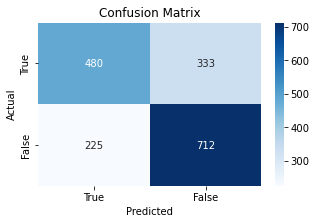

true_postives 480
true_negatives 712
false_postives 333
false_negatives 225
sensitivity 0.6808510638297872 to predict indoors, when the sample was recorded indoors
specificity 0.6813397129186602 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.5904059040590406 that a predicted indoors is really an indoors recording
Negative Predictive value 0.759871931696905 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 1.48
The ratio of false negatives to false postitives is 0.6756756756756757
This model meets the criteria of having less than 50% difference between classes for false predictions




In [ ]:

from sklearn.linear_model import LogisticRegression

model  = LogisticRegression(random_state=0)
model.fit(X_train, y_train)
kfold = KFold(n_splits=5, random_state=0, shuffle=True)
cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring='accuracy')
print(model)
print("%0.2f accuracy with a standard deviation of %0.2f" % (cv_results.mean(), cv_results.std()))
print(cv_results.mean(), cv_results.std())
actual_classes, predicted_classes = cross_val_predict(model, kfold, X_train, y_train)
matrix_and_results(actual_classes, predicted_classes, [True, False])



**Discussion** 

- The LogisticRegression has an accuracy of 68%, 
- The model satisfies our success criteria of less than a 50% difference in false positives and false negatives

### 8.14 QuadraticDiscriminantAnalysis

QuadraticDiscriminantAnalysis()
0.71 accuracy with a standard deviation of 0.02
0.714857142857143 0.024538183489810145


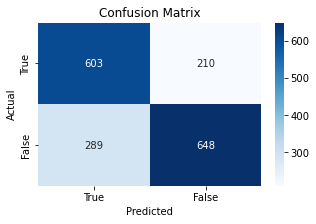

true_postives 603
true_negatives 648
false_postives 210
false_negatives 289
sensitivity 0.6760089686098655 to predict indoors, when the sample was recorded indoors
specificity 0.7552447552447552 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.7416974169741697 that a predicted indoors is really an indoors recording
Negative Predictive value 0.6915688367129136 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.726643598615917
The ratio of false negatives to false postitives is 1.3761904761904762
This model meets the criteria of having less than 50% difference between classes for false predictions




In [ ]:
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis


model = QuadraticDiscriminantAnalysis()
model.fit(X_train, y_train)
kfold = KFold(n_splits=5, random_state=0, shuffle=True)
cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring='accuracy')
print(model)
print("%0.2f accuracy with a standard deviation of %0.2f" % (cv_results.mean(), cv_results.std()))
print(cv_results.mean(), cv_results.std())
actual_classes, predicted_classes = cross_val_predict(model, kfold, X_train, y_train)
matrix_and_results(actual_classes, predicted_classes, [True, False])


**QuadraticDiscriminantAnalysis** 

- The LogisticRegression has an accuracy of 68%, 
- The model satisfies our success criteria of less than a 50% difference in false positives and false negatives

### 8.16 creation of pipelines for the best two performing models
### RandomForestClassifier(n_estimators=15, random_state=0)

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier

scaler = StandardScaler()

model  = RandomForestClassifier(n_estimators=15, random_state=0)

pipe_random_forrest = Pipeline([('StandardScaler',scaler), ('RandomForest', model)])

pipe_random_forrest.fit(X_train_unscaled, y_train)

Pipeline(steps=[('StandardScaler', StandardScaler()),
                ('RandomForest',
                 RandomForestClassifier(n_estimators=15, random_state=0))])

### C-Support Vector Classification C=3.5 , gamma=0.2

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC

scaler = StandardScaler()

model  = svm.SVC(C=3.5,gamma=0.2)

pipe_svc = Pipeline([('StandardScaler',scaler), ('SVC', model)])

pipe_svc.fit(X_train_unscaled, y_train)

Pipeline(steps=[('StandardScaler', StandardScaler()),
                ('SVC', SVC(C=3.5, gamma=0.2))])

### 8.17 Evaluation of best two performing models with the test dataset
### Random Forest Classifier (n_estimators-15)

0.712
Training Accuracy 0.9914285714285714
Validation  Accuracy 0.712


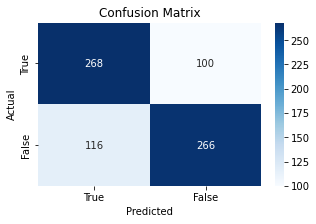

true_postives 268
true_negatives 266
false_postives 100
false_negatives 116
sensitivity 0.6979166666666666 to predict indoors, when the sample was recorded indoors
specificity 0.726775956284153 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.7282608695652174 that a predicted indoors is really an indoors recording
Negative Predictive value 0.6963350785340314 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.8620689655172413
The ratio of false negatives to false postitives is 1.16
This model meets the criteria of having less than 50% difference between classes for false predictions




In [ ]:

pipe_random_score = pipe_random_forrest.score(X_val_unscaled, y_val)

print(pipe_random_score)

yt_p = pipe_random_forrest.predict(X_train_unscaled)
yv_p = pipe_random_forrest.predict(X_val_unscaled)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))


actual_labels = y_val
predicted_labels = pipe_random_forrest.predict(X_val_unscaled)

matrix_and_results(actual_labels, predicted_labels, [True, False])

### C-Support Vector Classification C=3.5 , gamma=0.2

0.7146666666666667
Training Accuracy 0.7331428571428571
Validation  Accuracy 0.7146666666666667


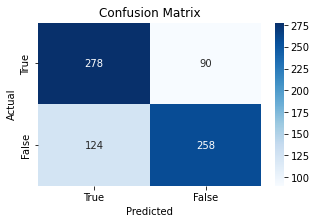

true_postives 278
true_negatives 258
false_postives 90
false_negatives 124
sensitivity 0.6915422885572139 to predict indoors, when the sample was recorded indoors
specificity 0.7413793103448276 to predict outdoors, when the sample was recorded outdoors
Postive Predictive value 0.7554347826086957 that a predicted indoors is really an indoors recording
Negative Predictive value 0.675392670157068 that a predicted outdoors is really an outdoors recording
The ratio of false postives to false negatives is 0.7258064516129032
The ratio of false negatives to false postitives is 1.3777777777777778
This model meets the criteria of having less than 50% difference between classes for false predictions




In [ ]:
pipe_random_score = pipe_svc.score(X_val_unscaled, y_val)

print(pipe_random_score)

yt_p = pipe_svc.predict(X_train_unscaled)
yv_p = pipe_svc.predict(X_val_unscaled)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))


actual_labels = y_val
predicted_labels = pipe_svc.predict(X_val_unscaled)

matrix_and_results(actual_labels, predicted_labels, [True, False])

### 8.18 Selection of the best performing model

There is no difference between our two final models in terms of the success criteria. 
both models achieved:
- An accuracy of 71.2 and 71.4%, 
- both models have less than a 50% difference in the ration of false negatives/positives. 

However  the confusion matrix for both models differs slightly. and the accuracy on the training set also differs significantly. 

The C support vector classification has a 37% difference between the classes false predictions, and a 73% training accuracy

the random forrest classifer has a 16% difference between the classes false predictions, and a 99% training accuracy. 

It might be that the random forrect is overtrained. However as the accuracy of the final dataset is the same as a model with less of a fit, I am unsure. 

Because of this, and the relative similarity between models in terms of accuracy, and both models meeting my predetermined success criteria I will choose to implement the C-Support Vector classifier in production. 

The final model to be trained for production will be:
##### C-Support Vector Classification C=3.5 , gamma=0.2

### 8.19 Final training of the final model with the entire dataset ready for production. 

- In this final step we will take our un normalised full dataset, and select only the features used to train the model. 
- we then train the model with all the data, and hand it over to you, the reader to validate with your own test data. 

In [ ]:
feature_set = ['mfcc_11', 'pow_spec_mean', 'pow_spec_std', 'Indoors']
finalset = full_df[feature_set].copy()
display(finalset)

,mfcc_11,pow_spec_mean,pow_spec_std,Indoors
0,-3.311075,0.446272,0.274280,False
1,-3.311639,0.486211,0.277349,False
2,-2.779424,0.516873,0.250180,True
3,-20.192146,0.476007,0.264075,True
4,-9.690632,0.583383,0.252923,True
...,...,...,...,...
2495,-10.384540,0.421697,0.289278,True
2496,-5.867772,0.548140,0.246723,True
2497,-12.645845,0.494310,0.272770,True
2498,5.051126,0.612144,0.223814,False


In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier

scaler = StandardScaler()

model  = svm.SVC(C=3.5,gamma=0.2)

production_pipeline = Pipeline([('StandardScaler',scaler), ('SVC', model)])

production_pipeline.fit(finalset.iloc[:,:-1], finalset.iloc[:,-1])

Pipeline(steps=[('StandardScaler', StandardScaler()),
                ('SVC', SVC(C=3.5, gamma=0.2))])

# 9 Conclusions



The final output of this project has an estimate accuracy of 71.4% with our testing data. 
The model was chosen on the basis of the success criteria which was to achieve the highest accuracy while minimising the ratio of false predictions between classes. 


I am satisfied with the end result, however it is clear that the features selected do not provide sufficient seperation between the classes for a linear prediction. 

I have learnt alot during the implementation of the project, and look forward to the advanced project with more experience and learning. 